## Telecom Churn Case Study

### Business Problem:
In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.
<br><br>
For many incumbent operators, retaining high profitable customers is the number one business goal.
<br><br>
To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.
<br><br>
In this project, weill analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

### Step 1: Importing Data

In [136]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [137]:
# Importing Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

#Importing library for iterative imputer
from fancyimpute import IterativeImputer

from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split,GridSearchCV,KFold,cross_val_score

from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import r2_score

from sklearn.linear_model import Lasso
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('float_format', '{:f}'.format)

In [138]:
#Import data
churn_data = pd.read_csv("telecom_churn_data.csv")
init_churn_data=churn_data.copy()
churn_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.000000,0.000000,0.000000,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385000,214.816000,213.803000,21.100000,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,nan,nan,0.000000,nan,0.000000,0.000000,0.000000,0.000000,nan,nan,0.160000,nan,nan,nan,4.130000,nan,nan,nan,1.150000,nan,nan,nan,5.440000,nan,nan,nan,0.000000,nan,nan,n

### Step 2: Inspecting the Dataframe

In [139]:
# checking columns in dataframe
churn_data.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

In [140]:
#Check column distribution
churn_data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,99999.000000,99999.000000,98981.000000,98981.000000,98981.000000,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,9225

In [141]:
#Check column info
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [142]:
#Check feature data types
churn_data.dtypes

mobile_number                 int64
circle_id                     int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6         object
last_date_of_month_7         object
last_date_of_month_8         object
last_date_of_month_9         object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7               float64
roam_ic_mou_8               float64
roam_ic_mou_9               float64
roam_og_mou_6               float64
roam_og_mou_7               float64
roam_og_mou_8               

In [143]:
#Find null percentage in columns to find if any need to be dropped
churn_data.isnull().sum() * 100 / len(churn_data)

mobile_number               0.000000
circle_id                   0.000000
loc_og_t2o_mou              1.018010
std_og_t2o_mou              1.018010
loc_ic_t2o_mou              1.018010
last_date_of_month_6        0.000000
last_date_of_month_7        0.601006
last_date_of_month_8        1.100011
last_date_of_month_9        1.659017
arpu_6                      0.000000
arpu_7                      0.000000
arpu_8                      0.000000
arpu_9                      0.000000
onnet_mou_6                 3.937039
onnet_mou_7                 3.859039
onnet_mou_8                 5.378054
onnet_mou_9                 7.745077
offnet_mou_6                3.937039
offnet_mou_7                3.859039
offnet_mou_8                5.378054
offnet_mou_9                7.745077
roam_ic_mou_6               3.937039
roam_ic_mou_7               3.859039
roam_ic_mou_8               5.378054
roam_ic_mou_9               7.745077
roam_og_mou_6               3.937039
roam_og_mou_7               3.859039
r

### Step 3: Deriving new features

In [144]:
# List of columns containing recharge amount and recharge data
amt_recharge_columns =  churn_data.columns[churn_data.columns.str.contains('rech_amt|rech_data')]
print(amt_recharge_columns)

Index(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'total_rech_amt_9', 'max_rech_amt_6', 'max_rech_amt_7',
       'max_rech_amt_8', 'max_rech_amt_9', 'date_of_last_rech_data_6',
       'date_of_last_rech_data_7', 'date_of_last_rech_data_8',
       'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7',
       'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6',
       'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9',
       'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8',
       'av_rech_amt_data_9'],
      dtype='object')


In [145]:
# Check missing values percentages
telecom_df_null_check = 100*churn_data.loc[:,amt_recharge_columns].isnull().sum()/len(churn_data)
df = pd.DataFrame(telecom_df_null_check)
df.rename(columns={0:'Null_Percentage'}, inplace=True)
df

,Null_Percentage
total_rech_amt_6,0.000000
total_rech_amt_7,0.000000
total_rech_amt_8,0.000000
total_rech_amt_9,0.000000
max_rech_amt_6,0.000000
max_rech_amt_7,0.000000
max_rech_amt_8,0.000000
max_rech_amt_9,0.000000
date_of_last_rech_data_6,74.846748
date_of_last_rech_data_7,74.428744


We can see recharge columns having almost 74% null percentage

In [146]:
churn_data.loc[:,amt_recharge_columns].describe()

,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9
count,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.000000
mean,327.514615,322.962970,324.157122,303.345673,104.637486,104.752398,107.728207,101.943889,2.463802,2.666419,2.651999,2.441170,126.393392,126.729459,125.717301,124.941440,192.600982,200.981292,197.526489,192.734315
std,398.019701,408.114237,416.540455,404.588583,120.614894,124.523970,126.902505,125.375109,2.789128,3.031593,3.074987,2.516339,108.477235,109.765267,109.437851,111.363760,192.646318,196.791224,191.301305,188.400286
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.500000,0.500000,1.000000
25%,109.000000,100.000000,90.000000,52.000000,30.000000,30.000000,30.000000,28.000000,1.000000,1.000000,1.000000,1.000000,25.000000,25.000000,25.000000,25.000000,82.000000,92.000000,87.000000,69.000000
50%,230.000000,220.000000,225.000000,200.000000,110.000000,110.000000,98.000000,61.000000,1.000000,1.000000,1.000000,2.000000,145.000000,145.000000,145.000000,145.000000,154.000000,154.000000,154.000000,164.000000
75%,437.500000,428.000000,434.500000,415.000000,120.000000,128.000000,144.000000,144.000000,3.000000,3.000000,3.000000,3.000000,177.000000,177.000000,179.000000,179.000000,252.000000,252.000000,252.000000,252.000000
max,35190.000000,40335.000000,45320.000000,37235.000000,4010.000000,4010.000000,4449.000000,3399.000000,61.000000,54.000000,60.000000,84.000000,1555.000000,1555.000000,1555.000000,1555.000000,7546.000000,4365.000000,4076.000000,4061.000000


We can create new feature -<br>
`total_rech_amt_data` using `total_rech_data` and `av_rech_amt_data` to capture amount utilized by customer for data.
<br><br>
We can impute the NA values by 0 as there were no recharges done by the customer.

In [147]:
#Update for month 6,7 and 8 as it is our analysis phase data

#NA to 0
churn_data['total_rech_data_6'] = churn_data['total_rech_data_6'].replace(np.NaN,0.0)
churn_data['total_rech_data_7'] = churn_data['total_rech_data_7'].replace(np.NaN,0.0)
churn_data['total_rech_data_8'] = churn_data['total_rech_data_8'].replace(np.NaN,0.0)
#NA to 0
churn_data['av_rech_amt_data_6'] = churn_data['av_rech_amt_data_6'].replace(np.NaN,0.0)
churn_data['av_rech_amt_data_7'] = churn_data['av_rech_amt_data_7'].replace(np.NaN,0.0)
churn_data['av_rech_amt_data_8'] = churn_data['av_rech_amt_data_8'].replace(np.NaN,0.0)

# total recharge amount from total_rech_amt_data for calculating High Value customer process
churn_data['total_rech_amt_data_6'] = churn_data.av_rech_amt_data_6 * churn_data.total_rech_data_6
churn_data['total_rech_amt_data_7'] = churn_data.av_rech_amt_data_7 * churn_data.total_rech_data_7
churn_data['total_rech_amt_data_8'] = churn_data.av_rech_amt_data_8 * churn_data.total_rech_data_8

churn_data['total_avg_rech_amnt_6_7_GPhase'] = (churn_data.total_rech_amt_data_6 + churn_data.total_rech_amt_data_7)/2

#### Filter High value customer data

In [148]:
# create a filter for values greater than 70th percentile of total average recharge amount for good phase 
high_value_filter = churn_data.total_avg_rech_amnt_6_7_GPhase.quantile(0.7)

print('70 percentile of 6th and 7th months avg recharge amount: '+str(high_value_filter))

telecom_df_high_val_cust = churn_data[churn_data.total_avg_rech_amnt_6_7_GPhase > high_value_filter]
print('Dataframe Shape after Filtering High Value Customers: ' + str(telecom_df_high_val_cust.shape))

70 percentile of 6th and 7th months avg recharge amount: 12.5
Dataframe Shape after Filtering High Value Customers: (29574, 230)


#### Tag churn customers and remove attributes of the churn phase

Churned customers<br> (churn=1, else 0) based on the fourth month as follows:<br> Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase.<br><br>
The attributes you need to use to tag churners are:total_ic_mou_9, total_og_mou_9, vol_2g_mb_9, vol_3g_mb_9<br><br>
After tagging churners, remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).

In [149]:
high_val_cust_9 = ['total_ic_mou_9', 'total_og_mou_9', 'vol_2g_mb_9','vol_3g_mb_9']

In [150]:
# Checking null percentages
df = 100*telecom_df_high_val_cust.loc[:,high_val_cust_9].isnull().sum()/len(telecom_df_high_val_cust)
df = pd.DataFrame(df)
df.rename(columns={0:'Null_Percentage'}, inplace=True)
df

,Null_Percentage
total_ic_mou_9,0.000000
total_og_mou_9,0.000000
vol_2g_mb_9,0.000000
vol_3g_mb_9,0.000000


In [151]:
# Initially set all the values as 0
telecom_df_high_val_cust['churn']= 0

In [152]:
#is_churned flag is set for high valued customers where above values are zero
is_churned = (telecom_df_high_val_cust.total_ic_mou_9 == 0) & \
             (telecom_df_high_val_cust.total_og_mou_9 == 0) & \
             (telecom_df_high_val_cust.vol_2g_mb_9 ==0) & \
             (telecom_df_high_val_cust.vol_3g_mb_9 ==0)

In [153]:
# set all which having is_churned True condition as 1
telecom_df_high_val_cust.loc[is_churned,'churn']=1

In [154]:
# let us check what's the % of churned customers
100*telecom_df_high_val_cust.churn.sum()/len(telecom_df_high_val_cust)

8.311354568201798

In [155]:
#Remove all attributes related to churn phase i.e. contains _9
churn_month_columns =  telecom_df_high_val_cust.columns[telecom_df_high_val_cust.columns.str.contains('_9')]

telecom_df_high_val_cust.drop(churn_month_columns,axis=1,inplace=True)

In [156]:
telecom_df_high_val_cust.shape

(29574, 177)

In [157]:
#Find null percentage in columns to find if any feature needs to be dropped
telecom_df_high_val_cust.isnull().sum() * 100 / len(telecom_df_high_val_cust)

mobile_number                     0.000000
circle_id                         0.000000
loc_og_t2o_mou                    1.396497
std_og_t2o_mou                    1.396497
loc_ic_t2o_mou                    1.396497
last_date_of_month_6              0.000000
last_date_of_month_7              0.179211
last_date_of_month_8              0.760803
arpu_6                            0.000000
arpu_7                            0.000000
arpu_8                            0.000000
onnet_mou_6                       3.567323
onnet_mou_7                       3.563941
onnet_mou_8                       5.876784
offnet_mou_6                      3.567323
offnet_mou_7                      3.563941
offnet_mou_8                      5.876784
roam_ic_mou_6                     3.567323
roam_ic_mou_7                     3.563941
roam_ic_mou_8                     5.876784
roam_og_mou_6                     3.567323
roam_og_mou_7                     3.563941
roam_og_mou_8                     5.876784
loc_og_t2t_

### Step 4: Handling Missing Values

In [158]:
# create column name list by types of columns
id_cols = ['mobile_number', 'circle_id']

date_cols = ['last_date_of_month_6',
             'last_date_of_month_7',
             'last_date_of_month_8',
             'date_of_last_rech_6',
             'date_of_last_rech_7',
             'date_of_last_rech_8',
             'date_of_last_rech_data_6',
             'date_of_last_rech_data_7',
             'date_of_last_rech_data_8'
            ]

cat_cols =  ['night_pck_user_6',
             'night_pck_user_7',
             'night_pck_user_8',
             'fb_user_6',
             'fb_user_7',
             'fb_user_8'
            ]

num_cols = [column for column in telecom_df_high_val_cust.columns if column not in id_cols + date_cols + cat_cols]

# print the number of columns in each list
print("#ID cols: %d\n#Date cols:%d\n#Numeric cols:%d\n#Category cols:%d" % (len(id_cols), len(date_cols), len(num_cols), len(cat_cols)))


#ID cols: 2
#Date cols:9
#Numeric cols:160
#Category cols:6


In [159]:
#Checking null values for categorical columns
telecom_df_high_val_cust.loc[:,cat_cols].isnull().sum()

night_pck_user_6    5770
night_pck_user_7    5244
night_pck_user_8    9391
fb_user_6           5770
fb_user_7           5244
fb_user_8           9391
dtype: int64

In [160]:
#Impute the non available categorical columns with 0
telecom_df_high_val_cust.loc[:,cat_cols] = telecom_df_high_val_cust.loc[:,cat_cols].fillna(value=0)

In [161]:
#Check null for categorical columns
telecom_df_high_val_cust.loc[:,cat_cols].isnull().sum()

night_pck_user_6    0
night_pck_user_7    0
night_pck_user_8    0
fb_user_6           0
fb_user_7           0
fb_user_8           0
dtype: int64

In [162]:
telecom_df_high_val_cust.drop(id_cols,axis=1,inplace=True)

In [163]:
# now, let's make sure values are imputed correctly
print("Missing value ratio:\n")
print(telecom_df_high_val_cust[date_cols].isnull().sum()*100/telecom_df_high_val_cust.shape[1])

Missing value ratio:

last_date_of_month_6          0.000000
last_date_of_month_7         30.285714
last_date_of_month_8        128.571429
date_of_last_rech_6          96.000000
date_of_last_rech_7         115.428571
date_of_last_rech_8         415.428571
date_of_last_rech_data_6   3297.142857
date_of_last_rech_data_7   2996.571429
date_of_last_rech_data_8   5366.285714
dtype: float64


#### Drop the date columns as the recharge data relevant to corresponding 6,7 and 8 months have been captured in derived variable.

In [164]:
telecom_df_high_val_cust.drop(date_cols,inplace=True,axis=1)

In [165]:
telecom_df_high_val_cust.shape

(29574, 166)

In [166]:
#Numerical columns missing handling
print("Missing value percentage:\n")
print(telecom_df_high_val_cust[num_cols].isnull().sum()*100/len(telecom_df_high_val_cust))

Missing value percentage:

loc_og_t2o_mou                    1.396497
std_og_t2o_mou                    1.396497
loc_ic_t2o_mou                    1.396497
arpu_6                            0.000000
arpu_7                            0.000000
arpu_8                            0.000000
onnet_mou_6                       3.567323
onnet_mou_7                       3.563941
onnet_mou_8                       5.876784
offnet_mou_6                      3.567323
offnet_mou_7                      3.563941
offnet_mou_8                      5.876784
roam_ic_mou_6                     3.567323
roam_ic_mou_7                     3.563941
roam_ic_mou_8                     5.876784
roam_og_mou_6                     3.567323
roam_og_mou_7                     3.563941
roam_og_mou_8                     5.876784
loc_og_t2t_mou_6                  3.567323
loc_og_t2t_mou_7                  3.563941
loc_og_t2t_mou_8                  5.876784
loc_og_t2m_mou_6                  3.567323
loc_og_t2m_mou_7           

In [167]:
num_cols_no_null=telecom_df_high_val_cust.columns[telecom_df_high_val_cust.apply(lambda num_cols: num_cols.isnull().sum()/len(telecom_df_high_val_cust) == 0)]
num_cols_no_null

Index(['arpu_6', 'arpu_7', 'arpu_8', 'total_og_mou_6', 'total_og_mou_7',
       'total_og_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8',
       'total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8',
       'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8',
       'last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8',
       'vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8', 'vol_3g_mb_6',
       'vol_3g_mb_7', 'vol_3g_mb_8', 'night_pck_user_6', 'night_pck_user_7',
       'night_pck_user_8', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8',
       'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6',
       'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7',
       'sachet_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'aon',
       'aug_v

In [168]:
num_cols_high_null=telecom_df_high_val_cust.columns[telecom_df_high_val_cust.apply(lambda num_cols: num_cols.isnull().sum()/len(telecom_df_high_val_cust) > 0.10)]
num_cols_high_null

Index(['max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8',
       'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'arpu_3g_6',
       'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8'],
      dtype='object')

In [169]:
num_cols_low_null = [column for column in num_cols if column not in num_cols_high_null]
num_cols_low_null = [column for column in num_cols_low_null if column not in num_cols_no_null]
num_cols_low_null

['loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_

In [170]:
telecom_df_high_val_cust.shape

(29574, 166)

### Step 5 : EDA

In [171]:
# writing a function for the recharge amounts and max 
# create box plot for  6th, 7th and 8th month
def plot_box_chart(attribute):
    plt.figure(figsize=(20,16))
    df = telecom_df_high_val_cust
    plt.subplot(2,3,1)
    sns.boxplot(data=df, y=attribute+"_6",x="churn",hue="churn",
                showfliers=False,palette=("plasma"))
    plt.title("The plot for churn vs " + attribute + "_6")

    plt.subplot(2,3,2)
    sns.boxplot(data=df, y=attribute+"_7",x="churn",hue="churn",
                showfliers=False,palette=("plasma"))
    plt.title("The plot for churn vs " + attribute + "_7")

    plt.subplot(2,3,3)
    sns.boxplot(data=df, y=attribute+"_8",x="churn",hue="churn",
                showfliers=False,palette=("plasma"))

    plt.title("The plot for churn vs " + attribute + "_8")
    plt.show()

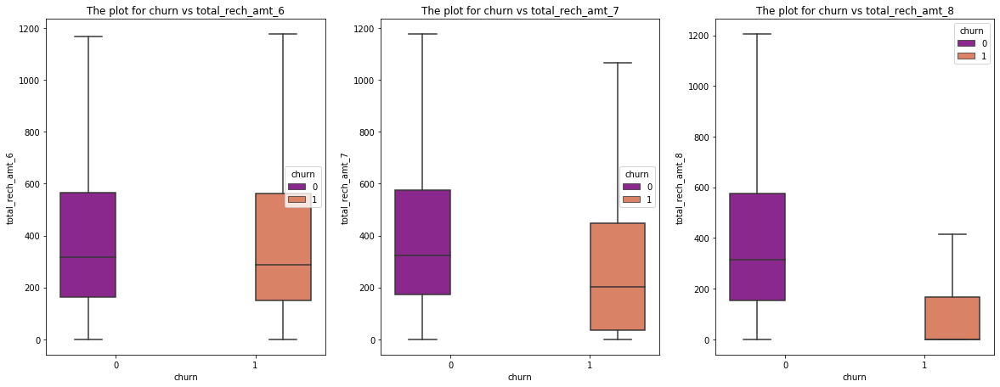

In [172]:

# Analysis : From the below graph we can analyse that for 8th month the total_rech_amt has dropped for churned customers

plot_box_chart('total_rech_amt')



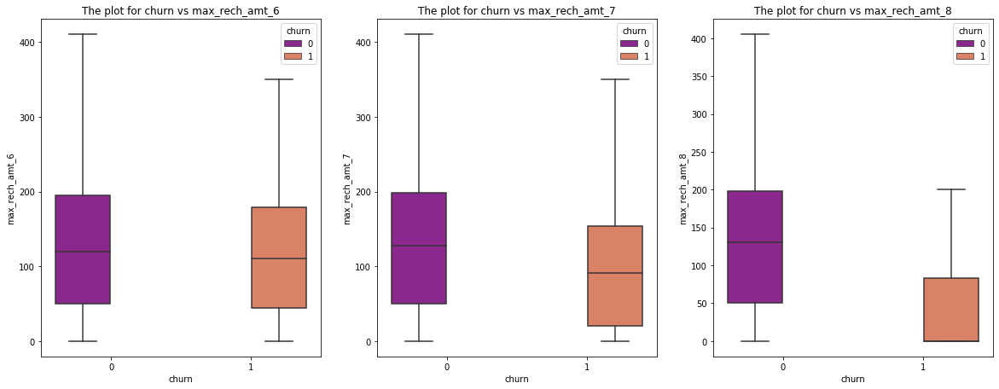

In [173]:
# from the below plot we can analyse that for 8th month the max_rech_amt has dropped for churned customers
plot_box_chart('max_rech_amt')


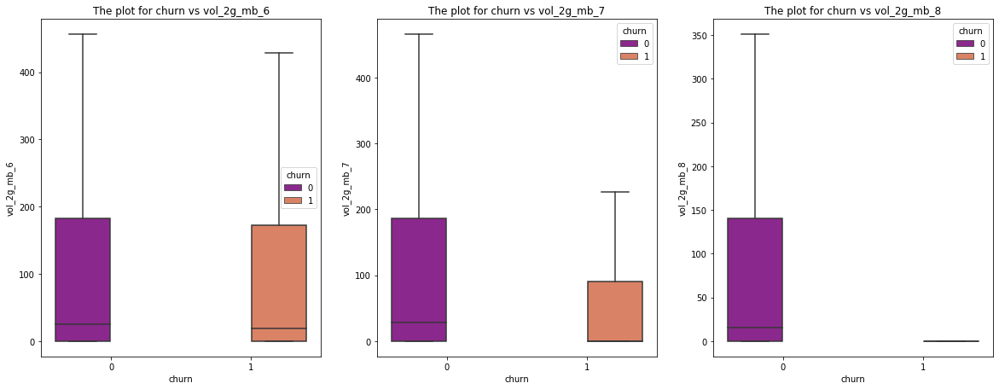

In [174]:
# Ploting for volume of 2G and 3G usage columns:
plot_box_chart('vol_2g_mb')

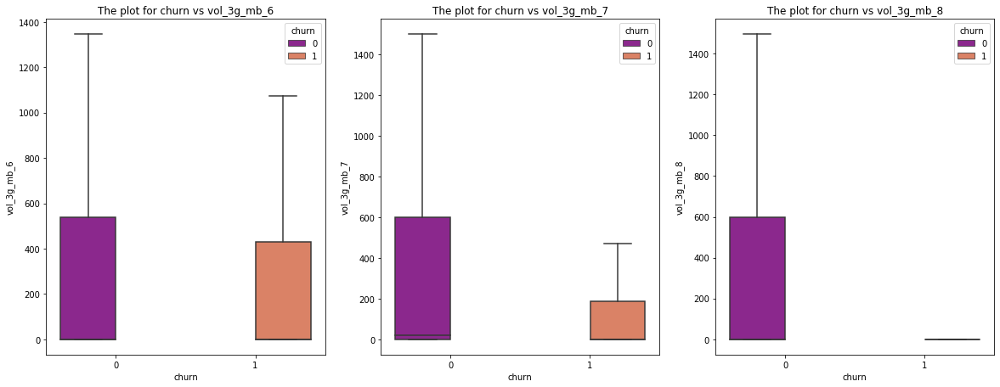

In [175]:
plot_box_chart('vol_3g_mb')


In [176]:
(telecom_df_high_val_cust.loc[:,['max_rech_data_6','max_rech_data_7','max_rech_data_8']].isnull().sum() * 100 )/len(telecom_df_high_val_cust)


max_rech_data_6   19.510381
max_rech_data_7   17.731791
max_rech_data_8   31.754244
dtype: float64

Since there are high null % we will use iterative imputer to fill the null data at the end

In [177]:
telecom_df_high_val_cust.shape

(29574, 166)

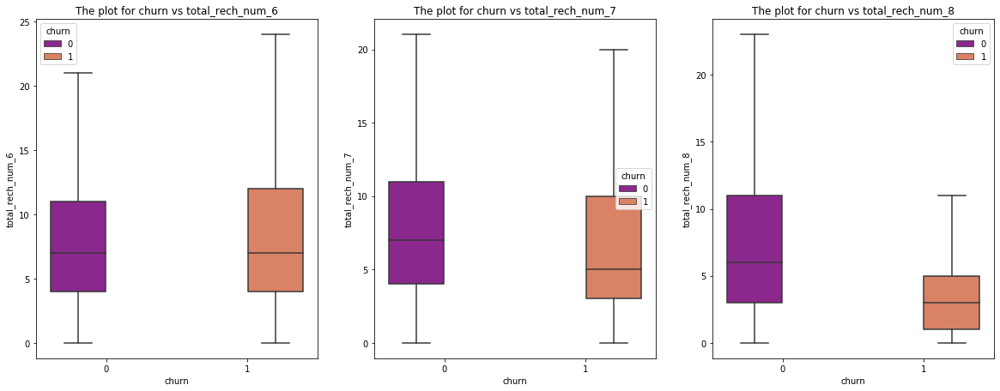

In [178]:
# Ploting for Total recharge for Number:
# from the below plot we can analyse that for 8th month the number of total recharge done has dropped for churned customers

plot_box_chart('total_rech_num')

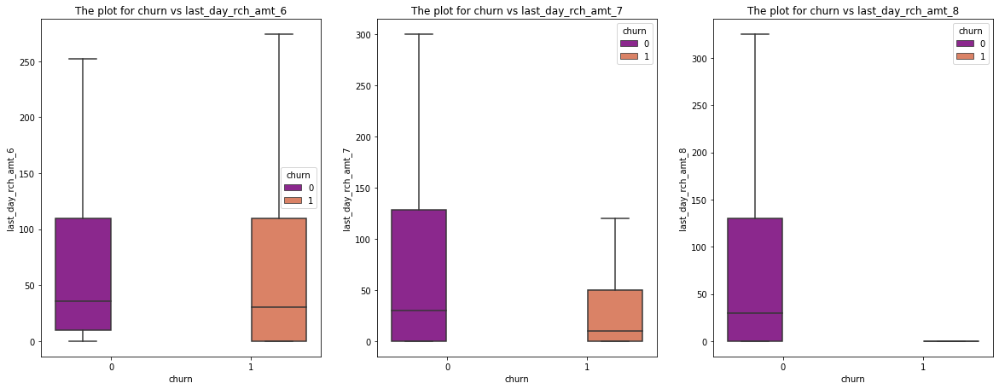

In [179]:
# Ploting for last day recharge amount:
# we can see that for 8th month there was churned data and we can also infer that there was no recharge done for the same
plot_box_chart('last_day_rch_amt')

In [180]:
# checking 2g,3g data columns

usage_2g_and_3g = telecom_df_high_val_cust.columns[telecom_df_high_val_cust.columns.str.contains('2g|3g',regex=True)]


In [181]:
usage_2g_and_3g

Index(['count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'vol_2g_mb_6',
       'vol_2g_mb_7', 'vol_2g_mb_8', 'vol_3g_mb_6', 'vol_3g_mb_7',
       'vol_3g_mb_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6',
       'arpu_2g_7', 'arpu_2g_8', 'monthly_2g_6', 'monthly_2g_7',
       'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8',
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g'],
      dtype='object')

In [182]:
#let us check the % of NA values present
percentage_3g_2g_null_check = 100*telecom_df_high_val_cust.loc[:,usage_2g_and_3g].isnull().sum()/len(telecom_df_high_val_cust.loc[:,usage_2g_and_3g])
df = pd.DataFrame(percentage_3g_2g_null_check)
df.rename(columns={0:'Null_Percentage'}, inplace=True)


In [183]:
# 3g , 2g data columns extracted in df dataframe
df

,Null_Percentage
count_rech_2g_6,19.510381
count_rech_2g_7,17.731791
count_rech_2g_8,31.754244
count_rech_3g_6,19.510381
count_rech_3g_7,17.731791
count_rech_3g_8,31.754244
vol_2g_mb_6,0.000000
vol_2g_mb_7,0.000000
vol_2g_mb_8,0.000000
vol_3g_mb_6,0.000000


Since there are high null % we will use iterative imputer to fill the null data at the end

In [184]:
(telecom_df_high_val_cust.loc[:,usage_2g_and_3g]).dtypes


count_rech_2g_6    float64
count_rech_2g_7    float64
count_rech_2g_8    float64
count_rech_3g_6    float64
count_rech_3g_7    float64
count_rech_3g_8    float64
vol_2g_mb_6        float64
vol_2g_mb_7        float64
vol_2g_mb_8        float64
vol_3g_mb_6        float64
vol_3g_mb_7        float64
vol_3g_mb_8        float64
arpu_3g_6          float64
arpu_3g_7          float64
arpu_3g_8          float64
arpu_2g_6          float64
arpu_2g_7          float64
arpu_2g_8          float64
monthly_2g_6         int64
monthly_2g_7         int64
monthly_2g_8         int64
sachet_2g_6          int64
sachet_2g_7          int64
sachet_2g_8          int64
monthly_3g_6         int64
monthly_3g_7         int64
monthly_3g_8         int64
sachet_3g_6          int64
sachet_3g_7          int64
sachet_3g_8          int64
aug_vbc_3g         float64
jul_vbc_3g         float64
jun_vbc_3g         float64
sep_vbc_3g         float64
dtype: object

In [185]:
telecom_df_high_val_cust.shape

(29574, 166)

In [186]:
list_below_20_numerical=['count_rech_2g_6','count_rech_2g_7','count_rech_3g_6','count_rech_3g_7','arpu_3g_6','arpu_3g_7','arpu_2g_6','arpu_2g_7']
list_below_20_numerical

['count_rech_2g_6',
 'count_rech_2g_7',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'arpu_3g_6',
 'arpu_3g_7',
 'arpu_2g_6',
 'arpu_2g_7']

In [187]:
for i in list_below_20_numerical:
    telecom_df_high_val_cust[i].fillna(telecom_df_high_val_cust[i].mean(),inplace=True)
    


In [188]:
100*telecom_df_high_val_cust.isnull().sum()/len(telecom_df_high_val_cust)

loc_og_t2o_mou                    1.396497
std_og_t2o_mou                    1.396497
loc_ic_t2o_mou                    1.396497
arpu_6                            0.000000
arpu_7                            0.000000
arpu_8                            0.000000
onnet_mou_6                       3.567323
onnet_mou_7                       3.563941
onnet_mou_8                       5.876784
offnet_mou_6                      3.567323
offnet_mou_7                      3.563941
offnet_mou_8                      5.876784
roam_ic_mou_6                     3.567323
roam_ic_mou_7                     3.563941
roam_ic_mou_8                     5.876784
roam_og_mou_6                     3.567323
roam_og_mou_7                     3.563941
roam_og_mou_8                     5.876784
loc_og_t2t_mou_6                  3.567323
loc_og_t2t_mou_7                  3.563941
loc_og_t2t_mou_8                  5.876784
loc_og_t2m_mou_6                  3.567323
loc_og_t2m_mou_7                  3.563941
loc_og_t2m_

In [189]:
#verified the null values were imputed to mean
telecom_df_high_val_cust[list_below_20_numerical].isnull().sum()

count_rech_2g_6    0
count_rech_2g_7    0
count_rech_3g_6    0
count_rech_3g_7    0
arpu_3g_6          0
arpu_3g_7          0
arpu_2g_6          0
arpu_2g_7          0
dtype: int64

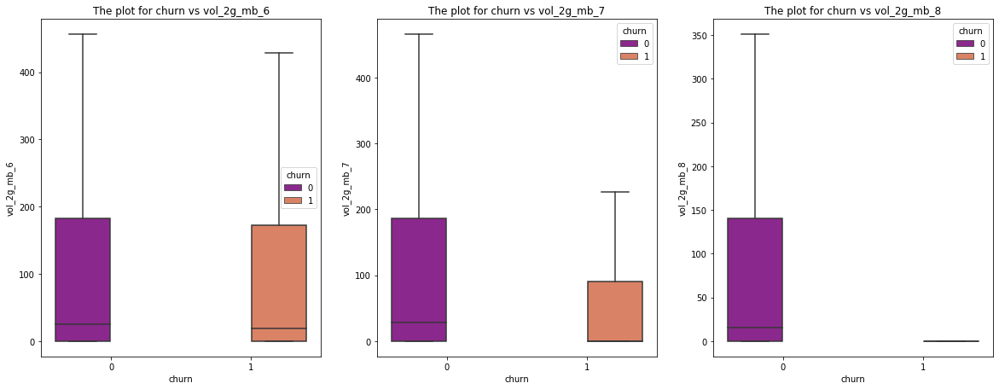

In [190]:
# Ploting for volume of 2G and 3G usage columns:
# we can see that 2G and 3G usage for churned customers drops in 8th month
plot_box_chart('vol_2g_mb')

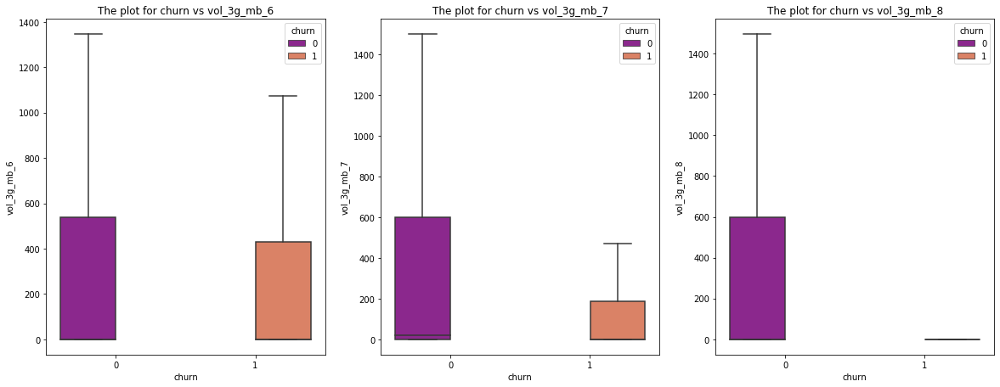

In [191]:
#We also see that 2G/3G usage is higher for non-churned customers indicating that churned customers might be from areas where 2G/3G service is not properly available.
plot_box_chart('vol_3g_mb')


In [192]:
# let's check monthly 2G/3G service schemes
monthly_subcription_2g_3g = telecom_df_high_val_cust.columns[telecom_df_high_val_cust.columns.str.contains('monthly_2g|monthly_3g',regex=True)]
monthly_subcription_2g_3g.tolist()

['monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8']

In [193]:
# checking null values for monthly columns : no nulls found
100*telecom_df_high_val_cust.loc[:,monthly_subcription_2g_3g].isnull().sum()/len(telecom_df_high_val_cust.loc[:,monthly_subcription_2g_3g])

monthly_2g_6   0.000000
monthly_2g_7   0.000000
monthly_2g_8   0.000000
monthly_3g_6   0.000000
monthly_3g_7   0.000000
monthly_3g_8   0.000000
dtype: float64

In [194]:
# writing function to plot monthly charts and make analysis
def plot_mean_bar_chart(df,columns_list):
    df_0 = df[df.churn==0].filter(columns_list)
    df_1 = df[df.churn==1].filter(columns_list)

    mean_df_0 = pd.DataFrame([df_0.mean()],index={'Non Churn'})
    mean_df_1 = pd.DataFrame([df_1.mean()],index={'Churn'})

    frames = [mean_df_0, mean_df_1]
    mean_bar = pd.concat(frames)

    mean_bar.T.plot.bar(figsize=(10,5),rot=0)
    plt.show()
    
    return mean_bar



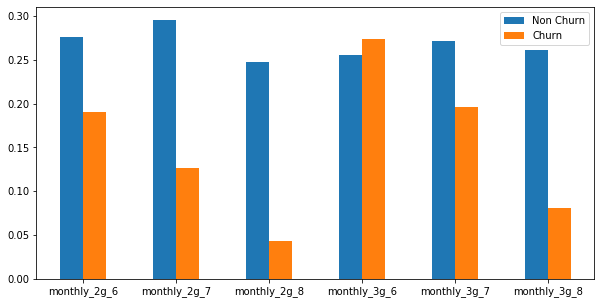

,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8
Non Churn,0.276442,0.295471,0.248045,0.255163,0.272017,0.261432
Churn,0.190399,0.126119,0.043124,0.273800,0.196094,0.080960


In [195]:
# Analysis from below graph:
# Again we can see a drop in monthly subscription for churned customers in 8th Month.

plot_mean_bar_chart(telecom_df_high_val_cust, monthly_subcription_2g_3g)


In [196]:
# let's check Volume based cost 
vbc_column = telecom_df_high_val_cust.columns[telecom_df_high_val_cust.columns.str.contains('vbc_',regex=True)]
vbc_column.tolist()


['aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g']

In [197]:
100*telecom_df_high_val_cust.loc[:,vbc_column].isnull().sum()/len(telecom_df_high_val_cust.loc[:,vbc_column])

aug_vbc_3g   0.000000
jul_vbc_3g   0.000000
jun_vbc_3g   0.000000
sep_vbc_3g   0.000000
dtype: float64

In [198]:
# Renaming month named vbc columns to 6,7,8,9 format
telecom_df_high_val_cust.rename(columns={'jun_vbc_3g':'vbc_3g_6','jul_vbc_3g':'vbc_3g_7','aug_vbc_3g':'vbc_3g_8'
                         ,'sep_vbc_3g':'vbc_3g_9'}, inplace=True)


In [199]:

# drop 9th month column as it is not needed
telecom_df_high_val_cust.drop('vbc_3g_9',axis=1,inplace=True)

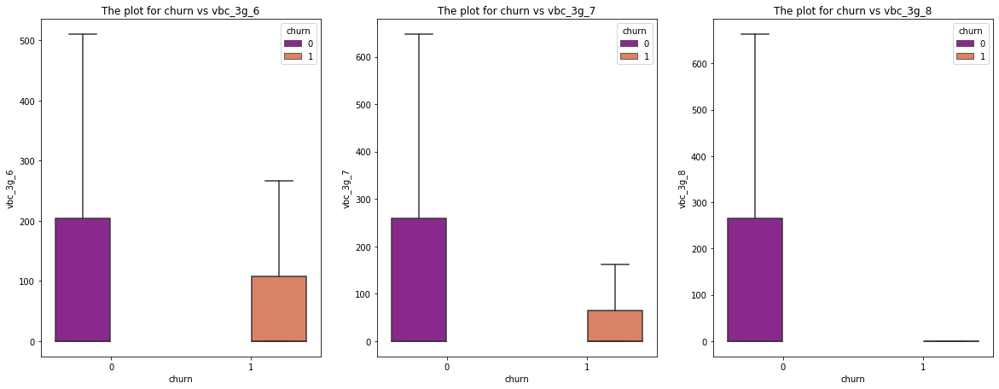

In [200]:
# Ploting for volume based cost :
# Analysis: volume based cost for 3G is much lower for Churned customers as compared to Non-Churned Customers and also there is a drop in vbc in 8th month

plot_box_chart('vbc_3g')

In [201]:
# Checking Service schemes with validity smaller than a month for 2G/3G
SC_2g_or_3g_col = telecom_df_high_val_cust.columns[telecom_df_high_val_cust.columns.str.contains('sachet_2g|sachet_3g',regex=True)]

In [202]:
# checking null percentage : no null values found
100*telecom_df_high_val_cust.loc[:,SC_2g_or_3g_col].isnull().sum()/len(telecom_df_high_val_cust.loc[:,SC_2g_or_3g_col])


sachet_2g_6   0.000000
sachet_2g_7   0.000000
sachet_2g_8   0.000000
sachet_3g_6   0.000000
sachet_3g_7   0.000000
sachet_3g_8   0.000000
dtype: float64

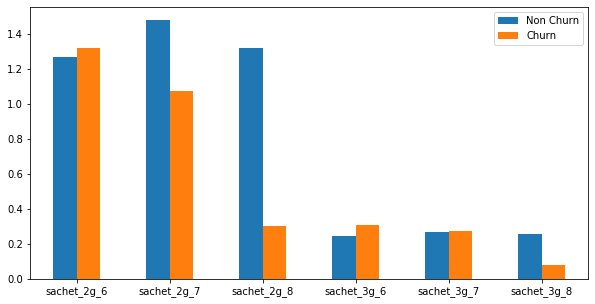

,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8
Non Churn,1.268992,1.480196,1.320143,0.244874,0.268550,0.258556
Churn,1.321806,1.074044,0.305126,0.307567,0.271766,0.078112


In [203]:
# from below graph we can see the drop in sachet services in 8th month for churned cutsomers
plot_mean_bar_chart(telecom_df_high_val_cust, SC_2g_or_3g_col)


In [204]:
# Checking columns for average revenue per user
arpu_cols = telecom_df_high_val_cust.columns[telecom_df_high_val_cust.columns.str.contains('arpu_')]


In [205]:
# check null percentage
100*telecom_df_high_val_cust.loc[:,arpu_cols].isnull().sum()/len(telecom_df_high_val_cust.loc[:,arpu_cols])


arpu_6       0.000000
arpu_7       0.000000
arpu_8       0.000000
arpu_3g_6    0.000000
arpu_3g_7    0.000000
arpu_3g_8   31.754244
arpu_2g_6    0.000000
arpu_2g_7    0.000000
arpu_2g_8   31.754244
dtype: float64

Since there are high null % we will use iterative imputer to fill the null data at the end

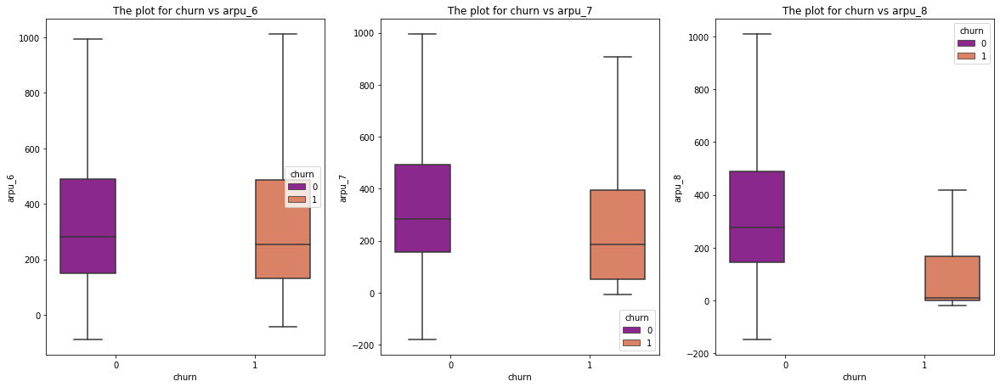

In [206]:
# Plotting arpu
plot_box_chart('arpu')

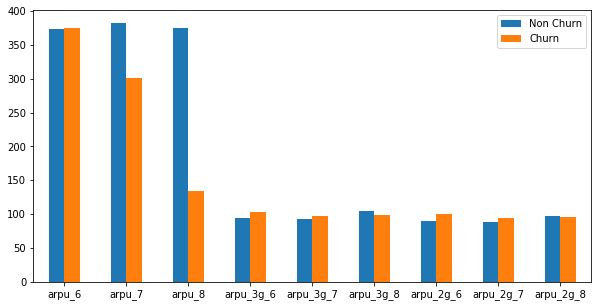

,arpu_6,arpu_7,arpu_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8
Non Churn,373.048557,382.302681,375.642598,93.673808,93.439628,104.241282,89.770086,89.183213,97.787399
Churn,375.348079,300.911961,134.285746,102.828211,97.215980,98.488789,99.687754,94.523465,95.781857


In [207]:
#  We can see that huge drops for Arpu in 8th month for churned customers
plot_mean_bar_chart(telecom_df_high_val_cust, arpu_cols)

In [208]:
# checking minutes of usage columns
mou_cols = telecom_df_high_val_cust.columns[telecom_df_high_val_cust.columns.str.contains('mou')]

In [209]:
# check null percentage
mou_df_null=pd.DataFrame(100*telecom_df_high_val_cust.loc[:,mou_cols].isnull().sum()/len(telecom_df_high_val_cust.loc[:,mou_cols]))

mou_df_null

,0
loc_og_t2o_mou,1.396497
std_og_t2o_mou,1.396497
loc_ic_t2o_mou,1.396497
onnet_mou_6,3.567323
onnet_mou_7,3.563941
onnet_mou_8,5.876784
offnet_mou_6,3.567323
offnet_mou_7,3.563941
offnet_mou_8,5.876784
roam_ic_mou_6,3.567323


In [210]:
mou_df_null.columns=['Null_per_mou']



In [211]:
mou_df_null.sort_values(by='Null_per_mou',ascending=False)

,Null_per_mou
isd_ic_mou_8,5.876784
loc_og_mou_8,5.876784
std_og_t2c_mou_8,5.876784
loc_ic_mou_8,5.876784
loc_og_t2f_mou_8,5.876784
loc_ic_t2f_mou_8,5.876784
loc_og_t2c_mou_8,5.876784
loc_ic_t2m_mou_8,5.876784
loc_ic_t2t_mou_8,5.876784
loc_og_t2t_mou_8,5.876784


In [212]:
#So for all minutes of usage columns the maximum missing % is 3.91 , means in these case the customer has not been used at all for that particular call type, 
# thus we can fill the missing values with zero

# replaceing null values by 0 for minutes of usage variables
telecom_df_high_val_cust.loc[:,mou_cols] = telecom_df_high_val_cust.loc[:,mou_cols].replace(np.NaN,0)

In [213]:
#checking null percentage
100*telecom_df_high_val_cust.loc[:,mou_cols].isnull().sum()/len(telecom_df_high_val_cust.loc[:,mou_cols])


loc_og_t2o_mou     0.000000
std_og_t2o_mou     0.000000
loc_ic_t2o_mou     0.000000
onnet_mou_6        0.000000
onnet_mou_7        0.000000
onnet_mou_8        0.000000
offnet_mou_6       0.000000
offnet_mou_7       0.000000
offnet_mou_8       0.000000
roam_ic_mou_6      0.000000
roam_ic_mou_7      0.000000
roam_ic_mou_8      0.000000
roam_og_mou_6      0.000000
roam_og_mou_7      0.000000
roam_og_mou_8      0.000000
loc_og_t2t_mou_6   0.000000
loc_og_t2t_mou_7   0.000000
loc_og_t2t_mou_8   0.000000
loc_og_t2m_mou_6   0.000000
loc_og_t2m_mou_7   0.000000
loc_og_t2m_mou_8   0.000000
loc_og_t2f_mou_6   0.000000
loc_og_t2f_mou_7   0.000000
loc_og_t2f_mou_8   0.000000
loc_og_t2c_mou_6   0.000000
loc_og_t2c_mou_7   0.000000
loc_og_t2c_mou_8   0.000000
loc_og_mou_6       0.000000
loc_og_mou_7       0.000000
loc_og_mou_8       0.000000
std_og_t2t_mou_6   0.000000
std_og_t2t_mou_7   0.000000
std_og_t2t_mou_8   0.000000
std_og_t2m_mou_6   0.000000
std_og_t2m_mou_7   0.000000
std_og_t2m_mou_8   0

In [214]:
mou_og_cols6 = telecom_df_high_val_cust.columns[telecom_df_high_val_cust.columns.str.contains('.*_og_.*mou_6',regex=True)]

In [215]:
telecom_df_high_val_cust.loc[:,mou_og_cols6].describe()


,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_t2c_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,total_og_mou_6
count,29574.000000,29574.000000,29574.000000,29574.000000,29574.000000,29574.000000,29574.000000,29574.000000,29574.000000,29574.000000,29574.000000,29574.000000,29574.000000,29574.000000
mean,13.737017,57.998966,101.022531,4.247907,1.453429,163.276502,55.754617,71.794036,1.083853,0.000000,128.634817,0.944442,4.893576,298.187497
std,75.146143,196.267265,182.462069,13.757493,5.423584,298.239896,213.993611,245.708163,7.389581,0.000000,356.752519,36.043989,12.896542,480.247802
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.580000,5.440000,0.000000,0.000000,9.260000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.515000
50%,0.000000,10.880000,38.900000,0.000000,0.000000,62.370000,0.000000,0.680000,0.000000,0.000000,3.030000,0.000000,0.000000,125.450000
75%,0.000000,44.210000,120.640000,2.690000,0.000000,192.075000,10.987500,32.120000,0.000000,0.000000,73.420000,0.000000,4.380000,372.700000
max,3775.110000,6093.340000,4729.740000,486.060000,184.560000,6153.290000,6482.440000,8314.760000,314.560000,0.000000,8432.990000,5900.660000,447.330000,8488.360000


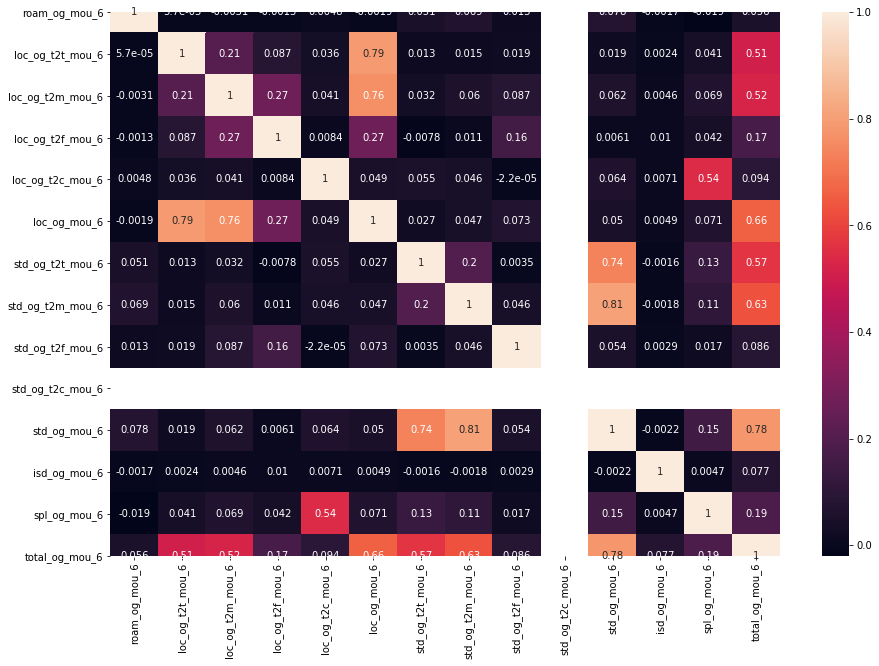

In [216]:
# checking correlation in between variables of Minutes of usage columns
plt.figure(figsize=(15,10))
sns.heatmap((telecom_df_high_val_cust.loc[:,mou_og_cols6]).corr(),annot=True)

#Analysis: We can see that total_og_mou_6, std_og_mou_6 and loc_og_mou_6 seems to have strong correlation with 
#other fileds and they needs to be inspected to avoid any multicolinearity issues.

In [217]:
telecom_df_high_val_cust.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_avg_rech_amnt_6_7_GPhase,churn
0,0.000000,0.000000,0.000000,197.385000,214.816000,213.803000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,nan,nan,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.160000,0.000000,0.000000,4.130000,0.000000,0.000000,1.150000,0.000000,0.000000,5.440000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.440000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,nan,nan,0.000000,4,3,2,362,252,252,252,252,252,252,252,252,1.000000,1.000000,1.000000,252.000000,252.000000,252.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,252.000000,252.000000,252.000000,30.130000,1.320000,5.750000,83.570000,150.760000,109.610000,212.170000,212.170000,212.170000,212.170000,212.170000,212.170000,0.000000,0.000000,0.000000,0,0,0,0,0,0,1,1,1,0,0,0,1.000000,1.000000,1.000000,968,30.400000,0.000000,101.200000,252.000000,252.000000,252.000000,252.000000,1
1,0.000000,0.000000,0.000000,34.047000,355.074000,268.321000,24.110000,78.680000,7.680000,15.740000,99.840000,304.760000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.880000,74.560000,7.680000,11.510000,75.940000,291

In [218]:

# We can see that total_og_mou_6, std_og_mou_6 and loc_og_mou_6 is a combination of other variables present in dataset.So we can remove these columns for all months from the data set
print(telecom_df_high_val_cust.loc[8,['std_og_mou_6']])

print(telecom_df_high_val_cust.loc[8,['std_og_t2m_mou_6']])

print(telecom_df_high_val_cust.loc[8,['std_og_t2t_mou_6']])

print(telecom_df_high_val_cust.loc[8,['std_og_t2f_mou_6']])



std_og_mou_6   130.260000
Name: 8, dtype: float64
std_og_t2m_mou_6   13.690000
Name: 8, dtype: float64
std_og_t2t_mou_6   116.560000
Name: 8, dtype: float64
std_og_t2f_mou_6   0.000000
Name: 8, dtype: float64


In [219]:
print(telecom_df_high_val_cust.loc[8,'total_og_mou_6'],"==",telecom_df_high_val_cust.loc[8,['loc_og_mou_6','std_og_mou_6','spl_og_mou_6','isd_og_mou_6','og_others_6']].sum())
print(telecom_df_high_val_cust.loc[8,'std_og_mou_6'],"==",telecom_df_high_val_cust.loc[8,['std_og_t2m_mou_6','std_og_t2t_mou_6','std_og_t2f_mou_6']].sum())
print(telecom_df_high_val_cust.loc[8,'loc_og_mou_6'],"==",telecom_df_high_val_cust.loc[8,['loc_og_t2m_mou_6','loc_og_t2t_mou_6','loc_og_t2f_mou_6']].sum())

508.36 == 508.34999999999997
130.26 == 130.25
378.09 == 378.09


In [220]:
# dropping the right hand side columns which are highly correlated and can be explained by the above left hand side columns


telecom_df_high_val_cust.drop(columns=['loc_og_mou_6','std_og_mou_6','spl_og_mou_6','isd_og_mou_6','og_others_6','std_og_t2m_mou_6','std_og_t2t_mou_6','std_og_t2f_mou_6','loc_og_t2m_mou_6','loc_og_t2t_mou_6','loc_og_t2f_mou_6'],axis=1,inplace=True)


In [221]:
telecom_df_high_val_cust.shape

(29574, 154)

In [222]:
# checking ic og columns null values and imputing to zero

ic_og_col = ['og_others_8', 'ic_others_8','ic_others_6', 'og_others_7', 'ic_others_7']


In [223]:
for i in ic_og_col:
    telecom_df_high_val_cust.loc[telecom_df_high_val_cust[i].isnull(),i]=0

In [224]:
telecom_df_high_val_cust.og_others_8.isnull().sum()*100/ len(telecom_df_high_val_cust)

0.0

In [225]:
telecom_df_high_val_cust.isnull().sum()

loc_og_t2o_mou                       0
std_og_t2o_mou                       0
loc_ic_t2o_mou                       0
arpu_6                               0
arpu_7                               0
arpu_8                               0
onnet_mou_6                          0
onnet_mou_7                          0
onnet_mou_8                          0
offnet_mou_6                         0
offnet_mou_7                         0
offnet_mou_8                         0
roam_ic_mou_6                        0
roam_ic_mou_7                        0
roam_ic_mou_8                        0
roam_og_mou_6                        0
roam_og_mou_7                        0
roam_og_mou_8                        0
loc_og_t2t_mou_7                     0
loc_og_t2t_mou_8                     0
loc_og_t2m_mou_7                     0
loc_og_t2m_mou_8                     0
loc_og_t2f_mou_7                     0
loc_og_t2f_mou_8                     0
loc_og_t2c_mou_6                     0
loc_og_t2c_mou_7         

In [226]:
# checking night_pack_user columns null values and imputing to zero

night_pck_col = ['night_pck_user_6','night_pck_user_7','night_pck_user_8']


In [227]:
#Checking Night Pack Users
telecom_df_high_val_cust.night_pck_user_6.value_counts()

0.000000    29042
1.000000      532
Name: night_pck_user_6, dtype: int64

In [228]:
#Check Night Pack users null percentage
telecom_df_high_val_cust.night_pck_user_6.isnull().sum()*100/ len(telecom_df_high_val_cust)

0.0

In [229]:
#Considering this as a categorical column which specifies if a customer has recharged a night pack so considering null as no recharge done and imputing with 0
for i in night_pck_col:
    telecom_df_high_val_cust.loc[telecom_df_high_val_cust[i].isnull(),i]=0

In [230]:
# checking fb_usr columns null %
telecom_df_high_val_cust.fb_user_8.isnull().sum()*100/ len(telecom_df_high_val_cust)

0.0

In [231]:
# checking fb_usr columns
fb_user_col=['fb_user_6','fb_user_7']

In [232]:
#Check fb user data
telecom_df_high_val_cust.fb_user_7.value_counts()

1.000000    22371
0.000000     7203
Name: fb_user_7, dtype: int64

In [233]:
# imputing fb_usr column null values as zero because if no data that means customer has not recharged

for i in fb_user_col:
    telecom_df_high_val_cust.loc[telecom_df_high_val_cust[i].isnull(),i]=0

In [234]:
# Checking remaining null values in the dataframe
telecom_df_high_val_cust.isnull().sum()

loc_og_t2o_mou                       0
std_og_t2o_mou                       0
loc_ic_t2o_mou                       0
arpu_6                               0
arpu_7                               0
arpu_8                               0
onnet_mou_6                          0
onnet_mou_7                          0
onnet_mou_8                          0
offnet_mou_6                         0
offnet_mou_7                         0
offnet_mou_8                         0
roam_ic_mou_6                        0
roam_ic_mou_7                        0
roam_ic_mou_8                        0
roam_og_mou_6                        0
roam_og_mou_7                        0
roam_og_mou_8                        0
loc_og_t2t_mou_7                     0
loc_og_t2t_mou_8                     0
loc_og_t2m_mou_7                     0
loc_og_t2m_mou_8                     0
loc_og_t2f_mou_7                     0
loc_og_t2f_mou_8                     0
loc_og_t2c_mou_6                     0
loc_og_t2c_mou_7         

#### Using Iterative Imputer for imputing remaining nulls

In [235]:
#Split data into dependent and independent variable
X = telecom_df_high_val_cust.drop("churn", axis  = 1)
y = telecom_df_high_val_cust['churn']

In [236]:
fancy = IterativeImputer(min_value = 0)
X_ii = pd.DataFrame(fancy.fit_transform(X))

In [237]:
X_ii.columns = X.columns

In [238]:
X_ii.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_7,std_og_mou_8,isd_og_mou_7,isd_og_mou_8,spl_og_mou_7,spl_og_mou_8,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_avg_rech_amnt_6_7_GPhase
0,0.000000,0.000000,0.000000,197.385000,214.816000,213.803000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.160000,0.000000,0.000000,4.130000,0.000000,0.000000,1.150000,0.000000,0.000000,5.440000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.440000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,3.000000,2.000000,362.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,1.000000,1.000000,1.000000,252.000000,252.000000,252.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,252.000000,252.000000,252.000000,30.130000,1.320000,5.750000,83.570000,150.760000,109.610000,212.170000,212.170000,212.170000,212.170000,212.170000,212.170000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,968.000000,30.400000,0.000000,101.200000,252.000000,252.000000,252.000000,252.000000
1,0.000000,0.000000,0.000000,34.047000,355.074000,268.321000,24.110000,78.680000,7.680000,15.740000,99.840000,304.760000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,74.560000,7.680000,75.940000,291.860000,0.000000,0.000000,0.000000,2.910000,0.000000,150.510000,299.540000,4.110000,0.000000,0.460

In [239]:
X_ii.isnull().sum()

loc_og_t2o_mou                    0
std_og_t2o_mou                    0
loc_ic_t2o_mou                    0
arpu_6                            0
arpu_7                            0
arpu_8                            0
onnet_mou_6                       0
onnet_mou_7                       0
onnet_mou_8                       0
offnet_mou_6                      0
offnet_mou_7                      0
offnet_mou_8                      0
roam_ic_mou_6                     0
roam_ic_mou_7                     0
roam_ic_mou_8                     0
roam_og_mou_6                     0
roam_og_mou_7                     0
roam_og_mou_8                     0
loc_og_t2t_mou_7                  0
loc_og_t2t_mou_8                  0
loc_og_t2m_mou_7                  0
loc_og_t2m_mou_8                  0
loc_og_t2f_mou_7                  0
loc_og_t2f_mou_8                  0
loc_og_t2c_mou_6                  0
loc_og_t2c_mou_7                  0
loc_og_t2c_mou_8                  0
loc_og_mou_7                

### Step 6 : Outlier Treatment

In [240]:
# create column name list by types of columns
id_cols = ['mobile_number', 'circle_id']

date_cols = ['last_date_of_month_6',
             'last_date_of_month_7',
             'last_date_of_month_8',
             'date_of_last_rech_6',
             'date_of_last_rech_7',
             'date_of_last_rech_8',
             'date_of_last_rech_data_6',
             'date_of_last_rech_data_7',
             'date_of_last_rech_data_8'
            ]

cat_cols =  ['night_pck_user_6',
             'night_pck_user_7',
             'night_pck_user_8',
             'fb_user_6',
             'fb_user_7',
             'fb_user_8'
            ]

num_cols = [column for column in telecom_df_high_val_cust.columns if column not in id_cols + date_cols + cat_cols]

# print the number of columns in each list
print("#ID cols: %d\n#Date cols:%d\n#Numeric cols:%d\n#Category cols:%d" % (len(id_cols), len(date_cols), len(num_cols), len(cat_cols)))



#ID cols: 2
#Date cols:9
#Numeric cols:148
#Category cols:6


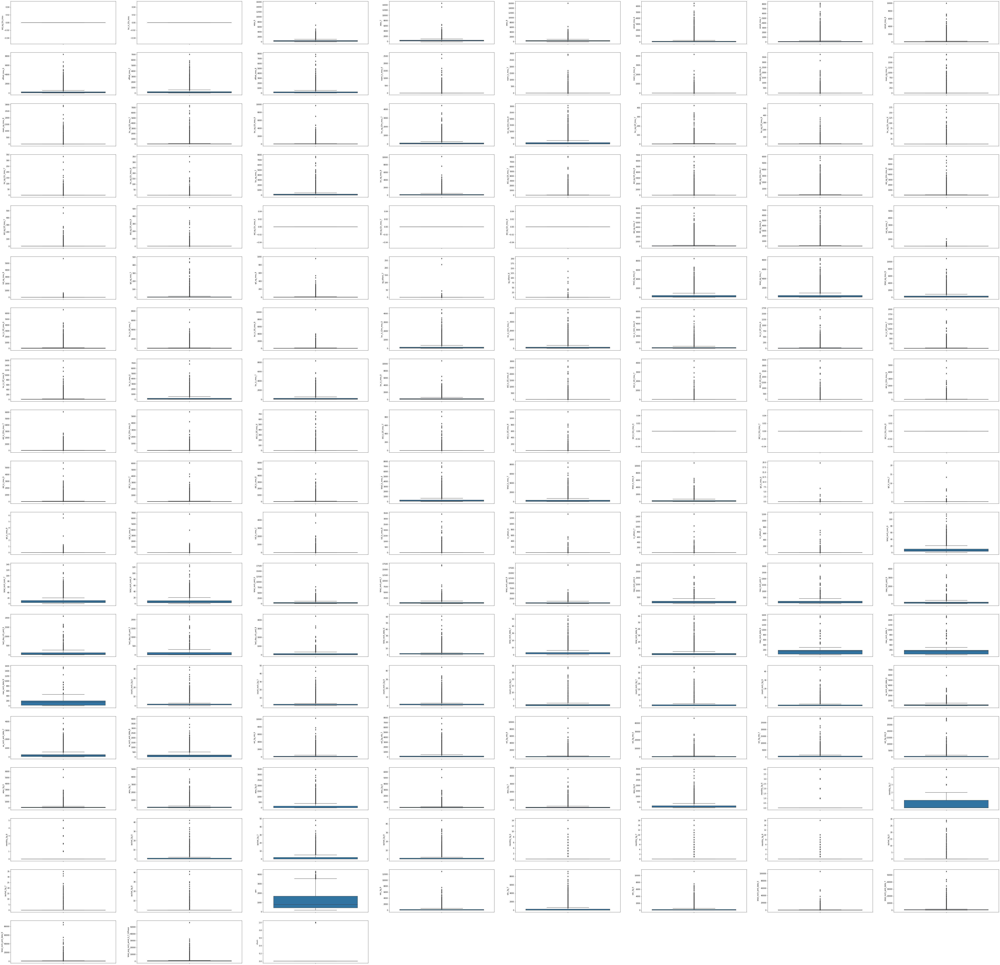

In [241]:
# checking outlier 
# plotting boxplot

plt.figure(figsize=(100,100))
for coll in range(2,len(num_cols)+1):
    plt.subplot(19,8,coll-1)
    sns.boxplot(data=telecom_df_high_val_cust, y=num_cols[coll-1])
plt.show()


In [242]:

# Capping for the numerical columns 
# capping the higher end value at 0.95 and lower at 0.01, as most of the outlier values in upper range
for x in num_cols:
    q1=telecom_df_high_val_cust[x].quantile(0.01)
    q4=telecom_df_high_val_cust[x].quantile(0.95)

    telecom_df_high_val_cust[x][telecom_df_high_val_cust[x] <=q1]=q1
    telecom_df_high_val_cust[x][telecom_df_high_val_cust[x] >=q4]=q4


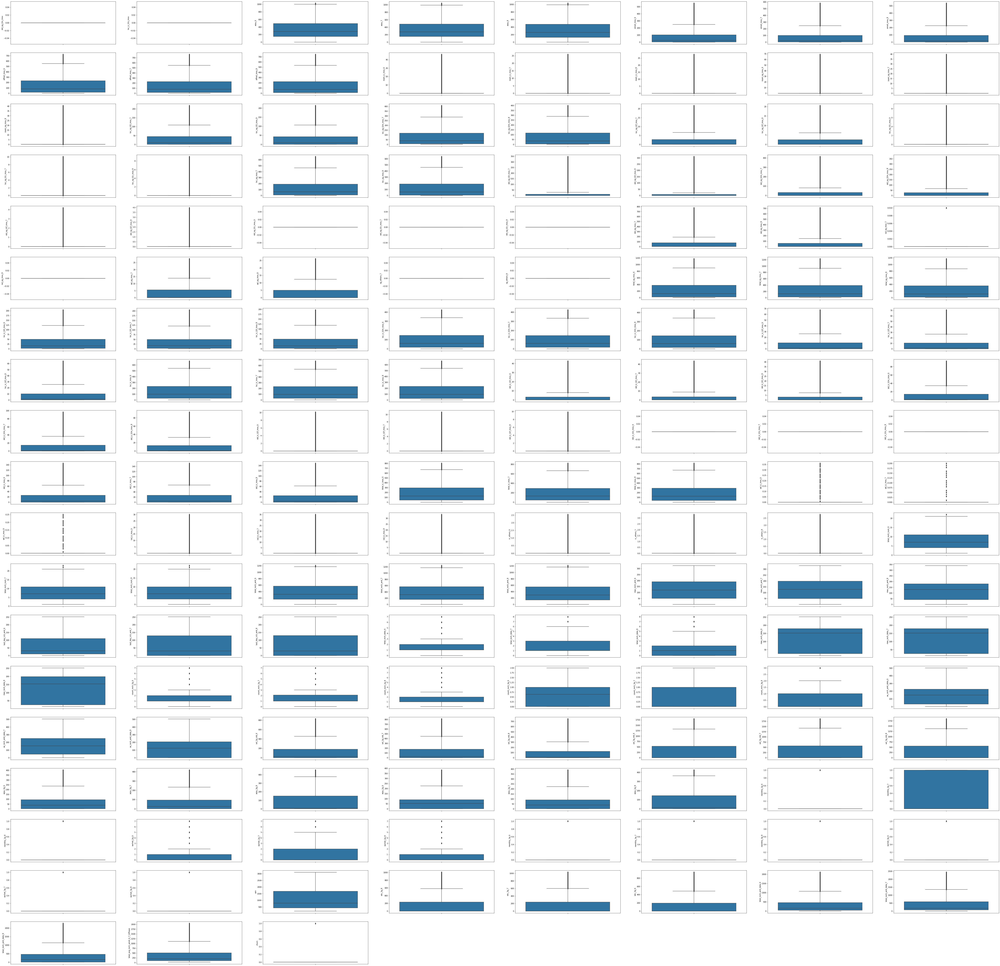

In [243]:
# checking outlier 
# plotting boxplot

plt.figure(figsize=(100,100))
for coll in range(2,len(num_cols)+1):
    plt.subplot(19,8,coll-1)
    sns.boxplot(data=telecom_df_high_val_cust, y=num_cols[coll-1])
plt.show()

### Step 7:Data Balancing

In [244]:
#Check Data imbalnce of Target variable
y.value_counts(normalize= True)

0   0.916886
1   0.083114
Name: churn, dtype: float64

In [245]:
#Check dependent variable datatypes
X_ii.dtypes

loc_og_t2o_mou                    float64
std_og_t2o_mou                    float64
loc_ic_t2o_mou                    float64
arpu_6                            float64
arpu_7                            float64
arpu_8                            float64
onnet_mou_6                       float64
onnet_mou_7                       float64
onnet_mou_8                       float64
offnet_mou_6                      float64
offnet_mou_7                      float64
offnet_mou_8                      float64
roam_ic_mou_6                     float64
roam_ic_mou_7                     float64
roam_ic_mou_8                     float64
roam_og_mou_6                     float64
roam_og_mou_7                     float64
roam_og_mou_8                     float64
loc_og_t2t_mou_7                  float64
loc_og_t2t_mou_8                  float64
loc_og_t2m_mou_7                  float64
loc_og_t2m_mou_8                  float64
loc_og_t2f_mou_7                  float64
loc_og_t2f_mou_8                  

In [246]:
X_ii.shape

(29574, 153)

In [247]:
# Data Balancing using SMOTE
smote = SMOTE(random_state=0)
X_smote, y_smote = smote.fit_resample(X_ii, y)

In [248]:
#Check if Data balance is successfull of Target variable
y_smote.value_counts(normalize= True)

1   0.500000
0   0.500000
Name: churn, dtype: float64

In [249]:
X_smote.shape

(54232, 153)

### Step 8: Train and Test split for Interpretable Model

In [250]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, train_size=0.7, random_state=45)
X_train.shape, X_test.shape

((37962, 153), (16270, 153))

### Step 9: Model Building for Interpretable Tree Model (Decision Tree)

Creating helper functions to evaluate model performance and help plot the decision tree

In [251]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X_smote.columns, 
                    class_names=['Churn', "No Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [252]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

### Hyper-parameter tuning for Decision Tree Model

In [253]:
dt = DecisionTreeClassifier(random_state=45,class_weight='balanced')

In [254]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [255]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "recall")

In [256]:
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 30 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:   17.7s finished


Wall time: 19.2 s


GridSearchCV(cv=4,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=45),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='recall', verbose=1)

In [257]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.592665,0.067141,0.027925,0.004288,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.772223,0.771225,0.776616,0.781636,0.775425,0.004119,21
1,0.651756,0.026467,0.017702,0.002378,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.772223,0.771225,0.776616,0.781636,0.775425,0.004119,21
2,0.634624,0.033066,0.014977,0.002530,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.772223,0.771225,0.776616,0.781636,0.775425,0.004119,21
3,0.597636,0.007516,0.021757,0.005924,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.772223,0.771225,0.776616,0.781636,0.775425,0.004119,21
4,0.582552,0.017751,0.014137,0.002843,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.772223,0.771225,0.776616,0.781636,0.775425,0.004119,21


In [258]:
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
10,1.134625,0.023200,0.013506,0.000495,gini,5,5,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.879941,0.893768,0.891027,0.902113,0.891712,0.007928,1
13,1.216478,0.038420,0.018132,0.003262,gini,5,50,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.885380,0.888749,0.895419,0.896047,0.891399,0.004501,2
11,1.145056,0.020375,0.014882,0.003271,gini,5,10,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.880360,0.892514,0.890190,0.900439,0.890876,0.007162,3
12,1.142217,0.028018,0.012239,0.002603,gini,5,20,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.879941,0.893141,0.888308,0.898766,0.890039,0.006905,4
14,1.210212,0.049564,0.014753,0.005122,gini,5,100,"{'criterion': 'gini', 'max_depth': 5, 'min_sam...",0.882033,0.888540,0.894164,0.894374,0.889778,0.005047,5


In [259]:
grid_search.best_estimator_

DecisionTreeClassifier(class_weight='balanced', max_depth=5, min_samples_leaf=5,
                       random_state=45)

In [260]:
dt_best = grid_search.best_estimator_

In [261]:
evaluate_model(dt_best)

# For Decision Tree model, After evaluating the accuracy for Train set is 86.55% and accuracy for Test set is 86.50%

Train Accuracy : 0.8655497602866024
Train Confusion Matrix:
[[15804  3033]
 [ 2071 17054]]
--------------------------------------------------
Test Accuracy : 0.8650891210817455
Test Confusion Matrix:
[[6957 1322]
 [ 873 7118]]


In [262]:
from sklearn.metrics import classification_report

In [263]:
print(classification_report(y_test, dt_best.predict(X_test)))

              precision    recall  f1-score   support

           0       0.89      0.84      0.86      8279
           1       0.84      0.89      0.87      7991

    accuracy                           0.87     16270
   macro avg       0.87      0.87      0.87     16270
weighted avg       0.87      0.87      0.87     16270



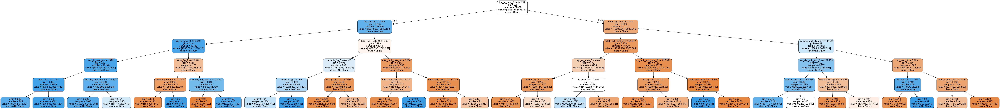

In [264]:
gph = get_dt_graph(dt_best)
Image(gph.create_png())

#### Analysis:

##### The customers having `loc_ic_mou_8`(local incoming minutes of usage for month 8)> 14.9896 and `roam_og_mou_8`(roaming outgoing minutes of usage for month 8) <=0 are more likely to churn and these customers should be prioritized to be retained
    

### Step 10 : PCA - Principal Component Analysis

In [265]:
telecom_df_high_val_cust_backup = telecom_df_high_val_cust.copy()

Dependent function

In [266]:
def get_scree_plot(X):
    pca = PCA(svd_solver='randomized', random_state=101)
    pca.fit(X)
    fig = plt.figure(figsize = (8,6))
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('number of components')
    plt.ylabel('cumulative explained variance')
    plt.show()
    return pca

def scale_data(X):
    scaler = StandardScaler()
    X_col = X.columns
    X_scaled = scaler.fit_transform(X)
    X_scale_final = pd.DataFrame(X_scaled, columns=X_col)
    print("Scaling the data ....")
    return X_scale_final

In [267]:
#Scale dependent variables
#Using X_smote data for PCA feature reduction
X_scaled = scale_data(X_smote)
print(X_scaled.shape)
X_scaled.head(5)

Scaling the data ....
(54232, 153)


,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_7,std_og_mou_8,isd_og_mou_7,isd_og_mou_8,spl_og_mou_7,spl_og_mou_8,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,total_avg_rech_amnt_6_7_GPhase
0,0.000000,0.000000,0.000000,-0.458318,-0.299775,-0.096777,-0.401930,-0.359664,-0.310742,-0.523526,-0.500009,-0.456462,-0.179835,-0.163563,-0.153443,-0.189270,-0.190022,-0.166608,-0.254016,-0.229743,-0.484418,-0.425680,-0.275754,-0.247721,-0.308704,-0.283090,-0.225438,-0.472713,-0.419393,-0.252932,-0.208376,-0.281914,-0.243754,-0.123592,-0.105198,0.000000,0.000000,0.000000,-0.350689,-0.291362,-0.038262,-0.026777,-0.408982,-0.295562,-0.013085,-0.015239,-0.586845,-0.540646,-0.467099,-0.295943,-0.286112,-0.252298,-0.554723,-0.517328,-0.431994,-0.297592,-0.272604,-0.222327,-0.557640,-0.539159,-0.454363,-0.162389,-0.146606,-0.143838,-0.240971,-0.234437,-0.193794,-0.142979,-0.139474,-0.111857,0.000000,0.000000,0.000000,-0.283496,-0.267607,-0.232892,-0.612594,-0.584366,-0.491795,-0.328580,-0.177145,-0.172483,-0.135602,-0.132685,-0.116708,-0.085861,-0.077218,-0.071586,-0.680609,-0.735687,-0.609452,-0.136187,-0.275183,-0.072756,0.923321,0.886136,1.130019,1.666593,1.839676,2.072118,-0.399688,-0.346995,-0.112323,1.320058,1.335013,1.779287,-0.840948,-0.895384,-0.445689,0.296723,0.275256,0.629649,0.541507,0.595106,0.890820,-0.394736,-0.434799,-0.315331,-0.332055,-0.239512,-0.211564,0.708926,0.762441,-0.512412,0.819921,0.864178,0.038945,-0.158870,-0.132473,-0.096551,-0.521396,-0.473729,-0.373021,-0.535135,-0.513356,-0.380303,1.241573,1.332357,1.582057,-0.275311,-0.239939,-0.182101,0.624662,0.739707,1.128608,-0.014273,-0.280929,-0.416509,-0.153944,-0.184897,-0.170258,-0.060641,-0.207917
1,0.000000,0.000000,0.000000,-0.909283,0.072674,0.063845,-0.320033,-0.099585,-0.280873,-0.480588,-0.204722,0.662959,-0.179835,-0.163563,-0.153443,-0.189270,-0.190022,-0.166608,0.190027,-0.177319,0.006844,1.577894,-0.275754,-0.247721,-0.308704,0.215340,-0

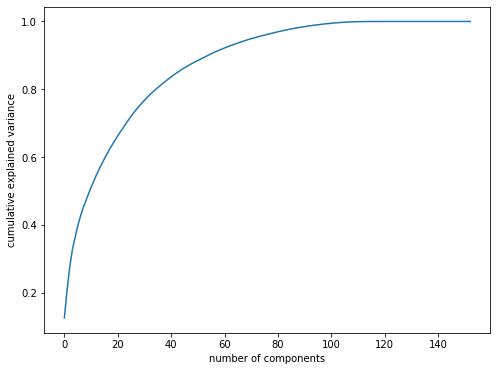

,PC1,PC2,PC3,Feature
0,-0.000000,0.000000,0.000000,loc_og_t2o_mou
1,-0.000000,0.000000,0.000000,std_og_t2o_mou
2,-0.000000,0.000000,-0.000000,loc_ic_t2o_mou
3,0.153648,-0.021481,-0.016892,arpu_6
4,0.179202,-0.028459,-0.000781,arpu_7
5,0.190467,-0.021098,0.008586,arpu_8
6,0.083082,-0.110374,0.010916,onnet_mou_6
7,0.097834,-0.123554,0.019018,onnet_mou_7
8,0.105930,-0.114354,0.022345,onnet_mou_8
9,0.100688,-0.110868,-0.009090,offnet_mou_6


In [268]:
 # scree plot
pca = get_scree_plot(X_scaled)

col = list(X_scaled.columns)
df_pca = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'PC3':pca.components_[2],'Feature':col})
df_pca.head(10)

### Step 11: Train and Test split before PCA

In [269]:
#Split PCA features dataframe in train and test data
X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_scaled, y_smote, train_size=0.7, random_state=45)
X_train_pca.shape, X_test_pca.shape

((37962, 153), (16270, 153))

PCA with 60 components is taken as 92% of variation has been captured

In [270]:
pc2 = PCA(n_components=60, random_state=45)

In [271]:
X_train_pca_new = pd.DataFrame(data=pc2.fit_transform(X_train_pca))
X_test_pca_new = pd.DataFrame(data=pc2.transform(X_test_pca))

In [272]:
X_train_pca_new.shape

(37962, 60)

In [273]:
X_train_pca_new.columns = ["PC"+ str(i) for i in range(0,len(X_train_pca_new.columns))]

In [274]:
X_test_pca_new.columns = ["PC"+ str(i) for i in range(0,len(X_test_pca_new.columns))]

In [275]:
X_train_pca_new.head()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59
0,-1.989105,-0.274748,-0.255796,-1.040058,-0.582285,0.033621,2.211827,-1.293125,-0.318404,-0.040404,0.933291,-0.096732,-2.519451,-0.462940,3.362219,0.795370,0.000442,0.211582,-0.048474,-0.156162,-0.613891,0.690666,0.092564,-0.767077,1.088256,-0.688536,0.988495,0.218054,-0.236353,-0.026151,-0.216284,0.091167,-0.336964,-0.127095,0.744842,0.187054,-0.154166,-0.087551,1.429454,0.213917,0.175601,1.127815,-1.491315,-1.528803,0.343965,-0.288279,0.176781,0.222085,-0.709563,-0.700621,-1.286256,-0.066056,-0.663709,0.095523,-0.694500,0.318193,-0.576601,0.315096,-0.393375,-0.442972
1,-2.959160,-0.885922,-1.195251,-1.106795,-0.308999,-0.080303,1.594467,-1.263017,0.266776,-0.371462,-0.317619,-0.061475,0.180119,0.052004,0.182222,-0.130230,-0.035344,-0.191946,0.096628,-0.303125,-0.537552,0.087337,0.057112,-0.131565,-0.500676,-0.319302,1.718154,-0.113586,-0.548944,0.015353,0.057666,0.227037,-0.209526,0.141840,-0.188202,0.461605,0.121024,0.321075,0.662276,-0.117663,0.339613,-0.207996,-0.401812,0.411449,0.216228,-0.235532,-0.182588,0.087644,0.061806,0.103653,-0.008857,-0.272510,0.373395,0.324409,-0.106857,-0.050685,0.030229,0.242456,-0.160154,-0.112479
2,6.147752,-8.703550,1.011610,-11.036102,-2.859705,0.176569,2.648491,8.602110,2.243580,0.069337,4.786849,-0.683544,0.019390,4.388601,-1.570929,-1.172005,0.301987,-0.706171,-0.626210,-4.878713,1.288506,0.822204,0.480162,1.429753,2.260998,-0.847243,0.152313,0.033573,0.919422,-0.716859,-0.122857,-0.833641,-0.730534,0.180802,-0.557379,0.959917,-1.011475,-0.261426,0.448275,1.405618,-0.767721,-0.266199,0.447827,0.072851,0.830962,-0.589193,0.062911,0.182508,-0.152443,-0.692289,-0.210036,-0.295291,-0.511383,0.196918,-0.400511,0.511728,0.646247,0.535718,0.855005,-0.158952
3,8.081244,-4.484078,-2.083953,8.389090,-0.729744,0.187243,-0.754550,-0.023645,-0.955243,1.676016,1.444151,-1.686502,-0.944040,-1.455755,-1.704218,1.095232,1.496876,-1.011652,0.711053,-3.325425,-0.846711,-0.963020,1.015637,1.119304,1.749958,2.824724,0.177214,-2.475193,-2.851698,-0.146710,-1.024187,0.644907,3.312027,-0.129408,1.442107,-1.262421,0.404545,-0.519288,1.983214,-2.093690,-0.104583,0.407207,1.249747,0.283490,0.203820,0.387386,0.316669,0.745749,-0.110965,-0.232856,-0.273641,-0.261959,0.317120,-1.751615,0.844201,0.954938,-1.663683,0.167016,0.496467,0.355052
4,-3.071724,1.486489,-2.129507,-1.278415,-0.416092,-0.261934,2.967183,-1.713251,0.503829,-1.665365,0.301177,-0.307266,-0.233488,-0.081848,-0.394180,-0.761934,-0.259408,0.414726,0.368944,-0.166449,0.106488,-0.105079,0.046782,-0.138656,-0.211552,0.290309,-0.066646,-0.483822,-0.028069,1.463828,-0.928051,0.196604,0.085227,0.419042,-0.246473,-0.056259,-0.252933,0.307783,0.233778,0.175850,0.428496,-0.477999,-0.220439,-0.105804,0.497888,0.166393,0.059286,-0.694073,-0.643523,-0.191459,-0.189060,0.291211,0.488057,-0.360308,0.333192,-0.184117,0.140417,-0.381128,-0.378160,0.188077


### Step 12:  Logistic Regression after PCA

In [276]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(class_weight='balanced')

##### Assessing the model with StatsModels

In [277]:
X_train_sm = sm.add_constant(X_train_pca_new)
logm2 = sm.GLM(np.array(y_train_pca),X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                37962
Model:                            GLM   Df Residuals:                    37901
Model Family:                Binomial   Df Model:                           60
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15537.
Date:                Sat, 28 Nov 2020   Deviance:                       31075.
Time:                        01:24:43   Pearson chi2:                 3.67e+14
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.3488      0.017    -20.511      0.000      -0.382      -0.316
PC0           -0.3720      0.006    -65.266      0.000      -0.383      -0.361
PC1            0.0484      0.005      9.167      0.000       0.038       0.059
PC2           -0.1128      0.007    -17.094      0.000      -0.126      -0.100
PC3           -0.4693      0.009    -51.390      0.000      -0.487      -0.451
PC4            0.1843      0.012     14.957      0.000       0.160       0.208
PC5            0.5199      0.010     52.526      0.000       0.501       0.539
PC6           -0.1206      0.009    -13.424      0.000      -0.138      -0.103
PC7           -0.1710      0.010    -16.500      0.000      -0.191      -0.151
PC8            0.0570      0.011      5.182      0.000       0.035       0.079
PC9           -0.2969      0.012    -25.269      0.000      -0.320      -0.274
PC10           0.2210      0.014     16.266      0.000       0.194       0.248
PC11          -0.0327      0.017     -1.886      0.059      -0.067       0.001
PC12          -0.1258      0.013     -9.716      0.000      -0.151      -0.100
PC13          -0.1137      0.015     -7.439      0.000      -0.144      -0.084
PC14          -0.1226      0.012     -9.946      0.000      -0.147      -0.098
PC15           0.2373      0.015     15.360      0.000       0.207       0.268
PC16          -0.0998      0.019     -5.245      0.000      -0.137      -0.063
PC17          -0.0281      0.018     -1.529      0.126      -0.064       0.008
PC18           0.0376      0.019      1.996      0.046       0.001       0.074
PC19           0.0031      0.019      0.161      0.872      -0.035       0.041
PC20           0.1089      0.022      4.844      0.000       0.065       0.153
PC21          -0.0506      0.023     -2.163      0.031      -0.096      -0.005
PC22          -0.0750      0.065     -1.152      0.249      -0.203       0.053
PC23          -0.1018      0.019     -5.242      0.000      -0.140      -0.064
PC24           0.0697      0.015      4.698      0.000       0.041       0.099
PC25           0.0320      0.016      2.046      0.041       0.001       0.063
PC26          -0.1038      0.014     -7.518      0.000      -0.131      -0.077
PC27          -0.1611      0.023     -7.006      0.000      -0.206      -0.116
PC28          -0.2297      0.018    -12.480      0.000      -0.266      -0.194
PC29          -0.2522      0.018    -14.089      0.000      -0.287      -0.217
PC30          -0.2986      0.020    -14.889      0.000      -0.338      -0.259
PC31          -0.1828      0.024     -7.504      0.000      -0.231      -0.135
PC32          -0.2643      0.025    -10.665      0.000      -0.313      -0.216
PC33          -0.2000      0.025     -7.974      0.000      -0.249      -0.151
PC34           0.3620      0.020     18.076      0.000       0.323       0.401
PC

In [278]:
# Getting the predicted values on the train set
y_train_pred_logreg1 = res.predict(X_train_sm)
y_train_pred_logreg1[:10]

0   0.662182
1   0.781695
2   0.658689
3   0.004995
4   0.852599
5   0.000718
6   0.664996
7   0.322104
8   0.802202
9   0.875523
dtype: float64

In [279]:
y_train_pred_logreg1 = y_train_pred_logreg1.values.reshape(-1)
y_train_pred_logreg1[:10]

array([6.62181759e-01, 7.81694815e-01, 6.58689107e-01, 4.99475044e-03,
       8.52598619e-01, 7.18055965e-04, 6.64996380e-01, 3.22103698e-01,
       8.02202224e-01, 8.75523107e-01])

##### Creating a dataframe with the actual churn flag and the predicted probabilities

In [280]:
y_train_pred_final_logreg1 = pd.DataFrame({'Churn':y_train_pca.values, 'Churn_Prob':y_train_pred_logreg1})
y_train_pred_final_logreg1['CustID'] = y_train_pca.index
y_train_pred_final_logreg1.head()

,Churn,Churn_Prob,CustID
0,0,0.662182,8015
1,1,0.781695,35166
2,1,0.658689,19226
3,0,0.004995,11555
4,1,0.852599,45268


##### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [281]:
y_train_pred_final_logreg1['predicted'] = y_train_pred_final_logreg1.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final_logreg1.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.662182,8015,1
1,1,0.781695,35166,1
2,1,0.658689,19226,1
3,0,0.004995,11555,0
4,1,0.852599,45268,1


In [282]:
from sklearn import metrics

In [283]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final_logreg1.Churn, y_train_pred_final_logreg1.predicted )
print(confusion)

[[15031  3806]
 [ 2781 16344]]


In [284]:
# Predicted     not_churn    churn
# Actual
# not_churn        15031     3806
# churn            2781      16344  

In [285]:
# Let's check the overall accuracy.
print("Accuracy :"+str(metrics.accuracy_score(y_train_pred_final_logreg1.Churn, y_train_pred_final_logreg1.predicted)))

Accuracy :0.8264843791159581


#### Unoptimized Recall for Logistic Regression model with PCA and 60 components

In [286]:
print("Recall value :"+str(confusion[1,1]/(confusion[1,0]+confusion[1,1])))

Recall value :0.8545882352941176


#### Finding Optimal Cutoff Point for Logistic Regression Model

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [287]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final_logreg1[i]= y_train_pred_final_logreg1.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final_logreg1.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.662182,8015,1,1,1,1,1,1,1,1,0,0,0
1,1,0.781695,35166,1,1,1,1,1,1,1,1,1,0,0
2,1,0.658689,19226,1,1,1,1,1,1,1,1,0,0,0
3,0,0.004995,11555,0,1,0,0,0,0,0,0,0,0,0
4,1,0.852599,45268,1,1,1,1,1,1,1,1,1,1,0


In [288]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','recall'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final_logreg1.Churn, y_train_pred_final_logreg1[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    recall = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    
    cutoff_df.loc[i] =[ i ,accuracy,recall]
print(cutoff_df)

             prob  accuracy   recall
0.000000 0.000000  0.503793 1.000000
0.100000 0.100000  0.693694 0.975948
0.200000 0.200000  0.753622 0.953935
0.300000 0.300000  0.792687 0.929621
0.400000 0.400000  0.815447 0.897935
0.500000 0.500000  0.826484 0.854588
0.600000 0.600000  0.828829 0.801935
0.700000 0.700000  0.817871 0.729203
0.800000 0.800000  0.778910 0.610039
0.900000 0.900000  0.589721 0.197438


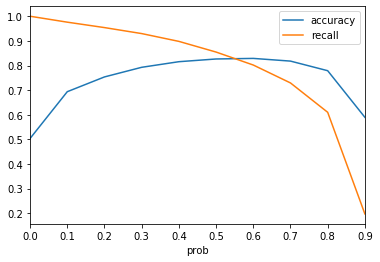

In [289]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','recall'])
plt.show()

#### From the curve above we consider 0.45 as the optimum point to take for a high recall and a suitable accuracy.

In [290]:
y_train_pred_final_logreg1['final_predicted'] = y_train_pred_final_logreg1.Churn_Prob.map( lambda x: 1 if x > 0.45 else 0)

y_train_pred_final_logreg1.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.662182,8015,1,1,1,1,1,1,1,1,0,0,0,1
1,1,0.781695,35166,1,1,1,1,1,1,1,1,1,0,0,1
2,1,0.658689,19226,1,1,1,1,1,1,1,1,0,0,0,1
3,0,0.004995,11555,0,1,0,0,0,0,0,0,0,0,0,0
4,1,0.852599,45268,1,1,1,1,1,1,1,1,1,1,0,1


In [291]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final_logreg1.Churn, y_train_pred_final_logreg1.final_predicted )
print(confusion)

[[14431  4406]
 [ 2335 16790]]


In [292]:
# Predicted     not_churn    churn
# Actual
# not_churn        15322     3515
# churn            3481      15644  

In [293]:
# Let's check the overall accuracy.
print("Train Accuracy :"+str(metrics.accuracy_score(y_train_pred_final_logreg1.Churn, y_train_pred_final_logreg1.final_predicted)))

Train Accuracy :0.8224276908487435


#### Optimized Recall for Logistic Regression model with PCA and 60 components

In [294]:
print("Train Recall value :"+str(confusion[1,1]/(confusion[1,0]+confusion[1,1])))

Train Recall value :0.8779084967320261


####  Making predictions on the test set for Logistic Regression Model 

In [295]:
X_test_sm = sm.add_constant(X_test_pca_new)

Making predictions on the test set

In [296]:
y_test_pred = res.predict(X_test_sm)

In [297]:
y_test_pred[:10]

0   0.969046
1   0.885865
2   0.871626
3   0.883583
4   0.000028
5   0.952927
6   0.577252
7   0.884587
8   0.602625
9   0.918255
dtype: float64

In [298]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [299]:
# Let's see the head
y_pred_1.head()

,0
0,0.969046
1,0.885865
2,0.871626
3,0.883583
4,0.000028


In [300]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test_pca)

In [301]:
# Putting CustID to index
y_test_df['CustID'] = y_test_df.index

In [302]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [303]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [304]:
y_pred_final.head()

,churn,CustID,0
0,1,51304,0.969046
1,1,53296,0.885865
2,1,51762,0.871626
3,1,51253,0.883583
4,0,25267,0.000028


In [305]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [306]:
y_pred_final

,churn,CustID,Churn_Prob
0,1,51304,0.969046
1,1,53296,0.885865
2,1,51762,0.871626
3,1,51253,0.883583
4,0,25267,0.000028
5,1,51752,0.952927
6,1,21278,0.577252
7,1,24642,0.884587
8,0,4975,0.602625
9,1,46524,0.918255


In [307]:
# Let's see the head of y_pred_final
y_pred_final.head()

,churn,CustID,Churn_Prob
0,1,51304,0.969046
1,1,53296,0.885865
2,1,51762,0.871626
3,1,51253,0.883583
4,0,25267,0.000028


In [308]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.45 else 0)

In [309]:
y_pred_final.head()

,churn,CustID,Churn_Prob,final_predicted
0,1,51304,0.969046,1
1,1,53296,0.885865,1
2,1,51762,0.871626,1
3,1,51253,0.883583,1
4,0,25267,0.000028,0


In [310]:
# Let's check the overall accuracy.
print(" Test Accuracy :"+str(metrics.accuracy_score(y_pred_final.churn, y_pred_final.final_predicted)))

 Test Accuracy :0.823540258143823


In [311]:
confusion2 = metrics.confusion_matrix(y_pred_final.churn, y_pred_final.final_predicted )
confusion2

array([[6418, 1861],
       [1010, 6981]], dtype=int64)

#### Optimized Recall for Logistic Regression model with PCA and 60 components

In [312]:
print("Test Recall value :"+str(confusion2[1,1]/(confusion2[1,0]+confusion2[1,1])))

Test Recall value :0.873607808784883


### Step 13 :  Random Forest after PCA

In [313]:
from sklearn.ensemble import RandomForestClassifier

Creating helper functions to evaluate model performance and help plot the decision tree of Random forest

In [314]:
def get_dt_graph_rf(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X_train_pca_new.columns, 
                    class_names=['Churn', "No Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [315]:
def evaluate_model_rf(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train_pca, dt_classifier.predict(X_train_pca_new)))
    print("Train Confusion Matrix:")
    cm3_train = confusion_matrix(y_train_pca, dt_classifier.predict(X_train_pca_new))
    print(confusion_matrix(y_train_pca, dt_classifier.predict(X_train_pca_new)))
    print("Train Recall value :"+str(cm3_train[1,1]/(cm3_train[1,0]+cm3_train[1,1])))
    
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test_pca, dt_classifier.predict(X_test_pca_new)))
    print("Test Confusion Matrix:")
    cm3_test = confusion_matrix(y_test_pca, dt_classifier.predict(X_test_pca_new))
    print(confusion_matrix(y_test_pca, dt_classifier.predict(X_test_pca_new)))
    print("Test Recall value :"+str(cm3_test[1,1]/(cm3_test[1,0]+cm3_test[1,1])))

In [316]:
rf = RandomForestClassifier(random_state=42, n_estimators=10, max_depth=10,max_features=60)

In [317]:
rf.fit(X_train_pca_new, y_train_pca)

RandomForestClassifier(max_depth=10, max_features=60, n_estimators=10,
                       random_state=42)

In [318]:
X_train_pca_new.columns

Index(['PC0', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9',
       'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18',
       'PC19', 'PC20', 'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26', 'PC27',
       'PC28', 'PC29', 'PC30', 'PC31', 'PC32', 'PC33', 'PC34', 'PC35', 'PC36',
       'PC37', 'PC38', 'PC39', 'PC40', 'PC41', 'PC42', 'PC43', 'PC44', 'PC45',
       'PC46', 'PC47', 'PC48', 'PC49', 'PC50', 'PC51', 'PC52', 'PC53', 'PC54',
       'PC55', 'PC56', 'PC57', 'PC58', 'PC59'],
      dtype='object')

In [319]:
rf.estimators_[0]

DecisionTreeClassifier(max_depth=10, max_features=60, random_state=1608637542)

In [320]:
sample_tree = rf.estimators_[2]

In [321]:
rf.estimators_

[DecisionTreeClassifier(max_depth=10, max_features=60, random_state=1608637542),
 DecisionTreeClassifier(max_depth=10, max_features=60, random_state=1273642419),
 DecisionTreeClassifier(max_depth=10, max_features=60, random_state=1935803228),
 DecisionTreeClassifier(max_depth=10, max_features=60, random_state=787846414),
 DecisionTreeClassifier(max_depth=10, max_features=60, random_state=996406378),
 DecisionTreeClassifier(max_depth=10, max_features=60, random_state=1201263687),
 DecisionTreeClassifier(max_depth=10, max_features=60, random_state=423734972),
 DecisionTreeClassifier(max_depth=10, max_features=60, random_state=415968276),
 DecisionTreeClassifier(max_depth=10, max_features=60, random_state=670094950),
 DecisionTreeClassifier(max_depth=10, max_features=60, random_state=1914837113)]

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.583468 to fit



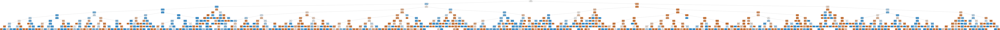

In [322]:
gph = get_dt_graph_rf(sample_tree)
Image(gph.create_png(), width=700, height=700)

In [323]:
evaluate_model_rf(rf)

Train Accuracy : 0.9231863442389758
Train Confusion Matrix:
[[16919  1918]
 [  998 18127]]
Train Recall value :0.9478169934640522
--------------------------------------------------
Test Accuracy : 0.8860479409956976
Test Confusion Matrix:
[[7201 1078]
 [ 776 7215]]
Test Recall value :0.9028907520961081


#### Grid search for hyper-parameter tuning

In [324]:
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [325]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [5, 10, 20,30],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'max_features': [60],
    'n_estimators': [10, 30, 50, 100, 200]
}

In [326]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=classifier_rf, param_grid=params, 
                          cv=4, n_jobs=-1, verbose=1, scoring = "recall")

In [327]:
%%time
grid_search.fit(X_train_pca_new,y_train_pca)

Fitting 4 folds for each of 100 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed: 18.6min
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed: 53.5min finished


Wall time: 54min 9s


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [5, 10, 20, 30], 'max_features': [60],
                         'min_samples_leaf': [5, 10, 20, 50, 100],
                         'n_estimators': [10, 30, 50, 100, 200]},
             scoring='recall', verbose=1)

In [328]:
rf_best = grid_search.best_estimator_

In [329]:
rf_best

RandomForestClassifier(max_depth=20, max_features=60, min_samples_leaf=5,
                       n_estimators=200, n_jobs=-1, random_state=42)

In [330]:
evaluate_model_rf(rf_best)

Train Accuracy : 0.9813234286918497
Train Confusion Matrix:
[[18262   575]
 [  134 18991]]
Train Recall value :0.9929934640522876
--------------------------------------------------
Test Accuracy : 0.9243392747387831
Test Confusion Matrix:
[[7549  730]
 [ 501 7490]]
Test Recall value :0.9373044675259667


### Step 14 :  XGBoost Model after PCA

In [331]:
import xgboost as xgb
from sklearn import metrics

xgclf = xgb.XGBClassifier()

xgclf.fit(X_train_pca_new,y_train_pca)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [332]:
print('AUC on train data by XGBoost =', metrics.roc_auc_score(y_true=y_train_pca,
                                                              y_score=xgclf.predict_proba(X_train_pca_new)[:, 1]))

AUC on train data by XGBoost = 0.9993944361344191


In [333]:
print('AUC on test data by XGBoost =', metrics.roc_auc_score(y_true=y_test_pca,
                                                             y_score=xgclf.predict_proba(X_test_pca_new)[:, 1]))

AUC on test data by XGBoost = 0.9807450748319664


In [334]:
# hyperparameters tuning
parameters = {'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5],
              'max_depth': [2, 4, 6, 8, 10, 20],
              'min_child_weight': [3, 7, 11, 19, 25],
              'n_estimators': [50, 100, 150, 200]}

scorer = metrics.make_scorer(metrics.roc_auc_score,
                             greater_is_better=True,
                             needs_proba=True,
                             needs_threshold=False)

clf_xgb = GridSearchCV(estimator=xgclf,
                                       param_grid=parameters,
                                       n_jobs=-1,
                                       cv=3,
                                       scoring=scorer,
                                       refit=True)

clf_xgb.fit(X_train_pca_new, y_train_pca)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0, gpu_id=-1,
                                     importance_type='gain',
                                     interaction_constraints='',
                                     learning_rate=0.300000012,
                                     max_delta_step=0, max_depth=6,
                                     min_child_weight=1, missing=nan,
                                     monotone_constraints='()',
                                     n_estimators=100, n_jobs=0,
                                     num_parallel_tree=1, random_state=0,
                                     reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, subsample=1,
                                     tree_method='exact', validate_parameters=1,
         

In [335]:
print(clf_xgb.best_params_)
print(clf_xgb.best_score_)
print(clf_xgb.best_estimator_)

{'learning_rate': 0.2, 'max_depth': 20, 'min_child_weight': 3, 'n_estimators': 200}
0.9850945000817125
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.2, max_delta_step=0, max_depth=20,
              min_child_weight=3, missing=nan, monotone_constraints='()',
              n_estimators=200, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [336]:
final_model = xgb.XGBClassifier(learning_rate=0.2,
                                max_depth=20,
                                min_child_weight=3,
                                n_estimators=200)

final_model.fit(X_train_pca_new, y_train_pca)
print('AUC on train data by XGBoost =', metrics.roc_auc_score(y_true=y_train_pca,
                                                              y_score=final_model.predict_proba(X_train_pca_new)[:, 1]))

print('AUC on test data by XGBoost =', metrics.roc_auc_score(y_true=y_test_pca,
                                                             y_score=final_model.predict_proba(X_test_pca_new)[:, 1]))

AUC on train data by XGBoost = 1.0
AUC on test data by XGBoost = 0.9903819430027038


In [337]:
print("Train Accuracy :", accuracy_score(y_train_pca, final_model.predict(X_train_pca_new)))
print("Train Confusion Matrix:")
cm4_train = confusion_matrix(y_train_pca, final_model.predict(X_train_pca_new))
print(confusion_matrix(y_train_pca, final_model.predict(X_train_pca_new)))
print("Train Recall value :"+str(cm4_train[1,1]/(cm4_train[1,0]+cm4_train[1,1])))
    
print("-"*50)
print("Test Accuracy :", accuracy_score(y_test_pca, final_model.predict(X_test_pca_new)))
print("Test Confusion Matrix:")
cm4_test = confusion_matrix(y_test_pca, final_model.predict(X_test_pca_new))
print(confusion_matrix(y_test_pca, final_model.predict(X_test_pca_new)))
print("Test Recall value :"+str(cm4_test[1,1]/(cm4_test[1,0]+cm4_test[1,1])))

Train Accuracy : 1.0
Train Confusion Matrix:
[[18837     0]
 [    0 19125]]
Train Recall value :1.0
--------------------------------------------------
Test Accuracy : 0.9566072526121696
Test Confusion Matrix:
[[7758  521]
 [ 185 7806]]
Test Recall value :0.9768489550744588


### Observation 

 #### For the Interpretable Model
 #####    Decision Tree Optimized Model
 #####      Analysis:          The customers having loc_ic_mou_8(local incoming minutes of usage for month 8)> 14.9896 and                           roam_og_mou_8(roaming outgoing minutes of usage for month 8) <=0 are more likely to churn and these                   customers should be prioritized to be retained
          Accuracy for Train and Test set is 0.86 and 0.86
          Recall for Train and Test set is 0.84 and 0.89 
 #### For Non Interpretable Model PCA        

 ##### For Logistic Optimized Model 
          Accuracy for Train and Test set is 0.82 and 0.82
          Recall for Train and Test set is 0.87 and 0.87 
 ##### For Random Forest Optimized Model 
          Accuracy for Train and Test set is 0.92 and 0.88
          Recall for Train and Test set is 0.94 and 0.90
 ##### For XGBoost Optimized Model 
          Accuracy for Train and Test set is 1.0 and 0.95
          Recall for Train and Test set is 1.0 and 0.97 
          
          
 ##### For Non Interpretable Models , considering the three models XGBoost performs the best.         